In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_flow_cytometry(df, bins=100):
    """
    Анализ распределений данных проточной цитометрии.
    - df: DataFrame с числовыми колонками (каналами)
    - bins: число бинов в гистограмме
    """
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    
    stats_all = {}

    for col in numeric_cols:
        data = df[col].dropna()

        # --- Статистика ---
        stats = {
            'count': data.count(),
            'mean': data.mean(),
            'median': data.median(),
            'std': data.std(),
            'min': data.min(),
            'max': data.max(),
            '1%': data.quantile(0.01),
            '5%': data.quantile(0.05),
            '25%': data.quantile(0.25),
            '75%': data.quantile(0.75),
            '95%': data.quantile(0.95),
            '99%': data.quantile(0.99),
        }
        stats_all[col] = stats

        # --- График распределения ---
        plt.figure(figsize=(8, 4))
        sns.histplot(data, bins=bins, kde=True)
        plt.title(f"Распределение канала: {col}")
        plt.xlabel(col)
        plt.ylabel("Количество событий")
        plt.tight_layout()
        plt.show()

        # --- Печать статистики ---
        print(f"\n===== Статистика по каналу {col} =====")
        for k, v in stats.items():
            print(f"{k:>6}: {v:.4g}")

    return stats_all


In [34]:
df = pd.read_parquet("E:/parquet/EG.5_58-Fc_11_d4e54875-ce9a-11f0-8905-f02f74d321c5.parquet")
df = df[["FSC-H", "SSC-H", "FITC-H", "FSC-A", "SSC-A", "FITC-A"]]

In [35]:
df2 = pd.read_parquet("E:/parquet/XFG_58-24-H15K(sa55)_A11_26aee69a-ce9a-11f0-b3e2-f02f74d321c5.parquet")
df2 = df2[["FSC-H", "SSC-H", "FITC-A", "FSC-A", "SSC-A", "FITC-A"]]

In [4]:
def compare_distributions(array1, array2, bins=100, label1="Sample 1", label2="Sample 2", clip_quantiles=True):
    """
    Сравнение двух распределений с квантильным фильтром:
    - clip_quantiles=True: отсекает всё ниже 1% и выше 99%
    """

    a1 = np.array(array1).flatten()
    a2 = np.array(array2).flatten()

    # --- Квантильный фильтр ---
    if clip_quantiles:
        q1_low, q1_high = np.quantile(a1, [0.01, 0.99])
        q2_low, q2_high = np.quantile(a2, [0.01, 0.99])

        a1 = a1[(a1 >= q1_low) & (a1 <= q1_high)]
        a2 = a2[(a2 >= q2_low) & (a2 <= q2_high)]

    # --- Статистика ---
    def get_stats(a):
        return {
            'count': len(a),
            'mean': np.mean(a),
            'median': np.median(a),
            'std': np.std(a),
            'min': np.min(a),
            'max': np.max(a),
            '1%': np.quantile(a, 0.01),
            '5%': np.quantile(a, 0.05),
            '25%': np.quantile(a, 0.25),
            '75%': np.quantile(a, 0.75),
            '95%': np.quantile(a, 0.95),
            '99%': np.quantile(a, 0.99),
        }

    stats1 = get_stats(a1)
    stats2 = get_stats(a2)

    # --- График ---
    plt.figure(figsize=(9, 5))
    sns.histplot(a1, bins=bins, kde=True, stat="density", alpha=0.5, label=label1)
    sns.histplot(a2, bins=bins, kde=True, stat="density", alpha=0.5, label=label2)
    plt.legend()
    plt.xlabel("Value")
    plt.ylabel("Density")
    plt.title("Сравнение распределений (1–99% фильтр)")
    plt.tight_layout()
    plt.show()

    # --- Печать статистики ---
    print(f"\n===== Статистика {label1} =====")
    for k, v in stats1.items():
        print(f"{k:>6}: {v:.4g}")

    print(f"\n===== Статистика {label2} =====")
    for k, v in stats2.items():
        print(f"{k:>6}: {v:.4g}")

    return {"sample1": stats1, "sample2": stats2}

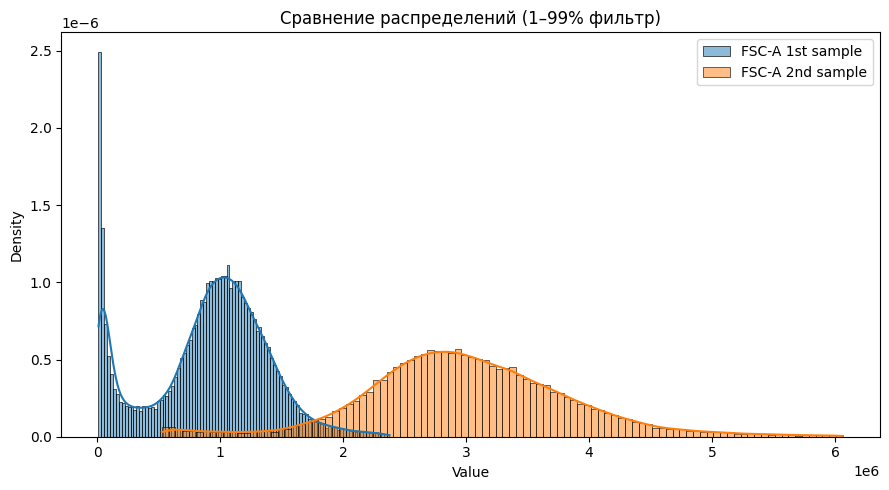


===== Статистика FSC-A 1st sample =====
 count: 4.9e+04
  mean: 9.055e+05
median: 9.754e+05
   std: 4.875e+05
   min: 9494
   max: 2.376e+06
    1%: 1.27e+04
    5%: 2.834e+04
   25%: 6.464e+05
   75%: 1.227e+06
   95%: 1.616e+06
   99%: 2.027e+06

===== Статистика FSC-A 2nd sample =====
 count: 3.92e+04
  mean: 2.994e+06
median: 2.955e+06
   std: 8.365e+05
   min: 5.248e+05
   max: 6.063e+06
    1%: 6.901e+05
    5%: 1.698e+06
   25%: 2.489e+06
   75%: 3.493e+06
   95%: 4.379e+06
   99%: 5.263e+06


{'sample1': {'count': 49000,
  'mean': 905511.9356489795,
  'median': 975393.845,
  'std': 487549.89722301526,
  'min': 9494.28,
  'max': 2376122.25,
  '1%': 12695.604299999999,
  '5%': 28343.960000000003,
  '25%': 646421.845,
  '75%': 1226668.5625,
  '95%': 1616408.9859999996,
  '99%': 2027273.3925000003},
 'sample2': {'count': 39200,
  'mean': 2993849.1669642855,
  'median': 2955127.0,
  'std': 836485.1139858431,
  'min': 524787.0,
  'max': 6062554.0,
  '1%': 690107.52,
  '5%': 1697785.85,
  '25%': 2489005.75,
  '75%': 3492861.75,
  '95%': 4379021.049999999,
  '99%': 5262520.04}}

In [5]:
compare_distributions(df['FSC-A'].values, df2['FSC-A'].values, label1="FSC-A 1st sample", label2="FSC-A 2nd sample")

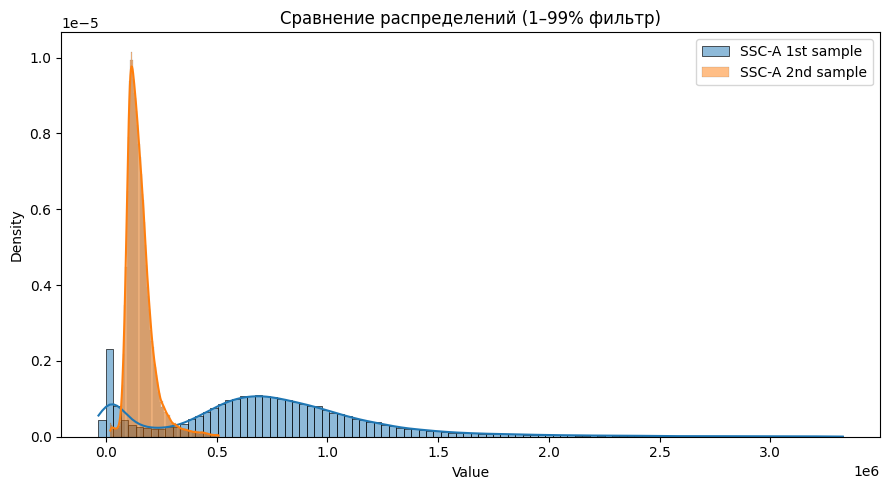


===== Статистика SSC-A 1st sample =====
 count: 4.9e+04
  mean: 7.483e+05
median: 7.172e+05
   std: 5.086e+05
   min: -3.32e+04
   max: 3.327e+06
    1%: -2531
    5%: 1.147e+04
   25%: 4.592e+05
   75%: 9.894e+05
   95%: 1.63e+06
   99%: 2.51e+06

===== Статистика SSC-A 2nd sample =====
 count: 3.92e+04
  mean: 1.533e+05
median: 1.408e+05
   std: 6.014e+04
   min: 1.997e+04
   max: 5.091e+05
    1%: 6.116e+04
    5%: 8.807e+04
   25%: 1.141e+05
   75%: 1.765e+05
   95%: 2.639e+05
   99%: 3.927e+05


{'sample1': {'count': 49000,
  'mean': 748266.0300979592,
  'median': 717202.72,
  'std': 508591.231709621,
  'min': -33198.81,
  'max': 3327427.5,
  '1%': -2531.3428,
  '5%': 11469.1715,
  '25%': 459157.27749999997,
  '75%': 989352.3725,
  '95%': 1630295.5484999972,
  '99%': 2509817.6350000002},
 'sample2': {'count': 39200,
  'mean': 153342.64293367346,
  'median': 140758.5,
  'std': 60136.227505418035,
  'min': 19972.0,
  'max': 509113.0,
  '1%': 61156.98,
  '5%': 88072.15,
  '25%': 114110.25,
  '75%': 176475.0,
  '95%': 263926.04999999976,
  '99%': 392699.0800000004}}

In [6]:
compare_distributions(df['SSC-A'].values, df2['SSC-A'].values, label1="SSC-A 1st sample", label2="SSC-A 2nd sample")

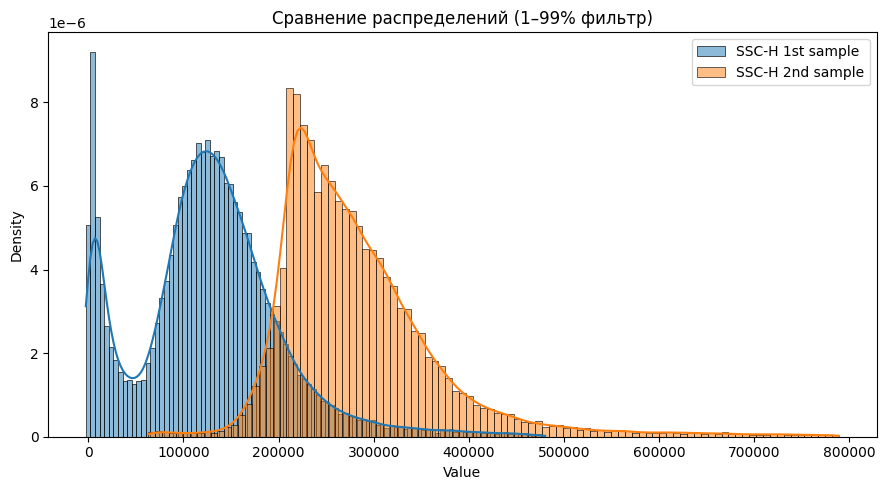


===== Статистика SSC-H 1st sample =====
 count: 4.9e+04
  mean: 1.266e+05
median: 1.256e+05
   std: 7.63e+04
   min: -2597
   max: 4.803e+05
    1%: 485.9
    5%: 4583
   25%: 8.447e+04
   75%: 1.668e+05
   95%: 2.534e+05
   99%: 3.74e+05

===== Статистика SSC-H 2nd sample =====
 count: 3.92e+04
  mean: 2.824e+05
median: 2.645e+05
   std: 8.558e+04
   min: 6.316e+04
   max: 7.89e+05
    1%: 1.492e+05
    5%: 1.906e+05
   25%: 2.255e+05
   75%: 3.172e+05
   95%: 4.359e+05
   99%: 6.253e+05


{'sample1': {'count': 49000,
  'mean': 126567.74216326531,
  'median': 125569.0,
  'std': 76301.74041331795,
  'min': -2597.0,
  'max': 480298.0,
  '1%': 485.8600000000001,
  '5%': 4582.950000000001,
  '25%': 84474.25,
  '75%': 166829.75,
  '95%': 253419.29999999987,
  '99%': 373980.6200000001},
 'sample2': {'count': 39200,
  'mean': 282428.5905612245,
  'median': 264533.0,
  'std': 85582.46403706052,
  'min': 63164.0,
  'max': 789027.0,
  '1%': 149214.29,
  '5%': 190558.0,
  '25%': 225527.0,
  '75%': 317180.5,
  '95%': 435853.5499999999,
  '99%': 625282.1400000005}}

In [7]:
compare_distributions(df['SSC-H'].values, df2['SSC-H'].values, label1="SSC-H 1st sample", label2="SSC-H 2nd sample")

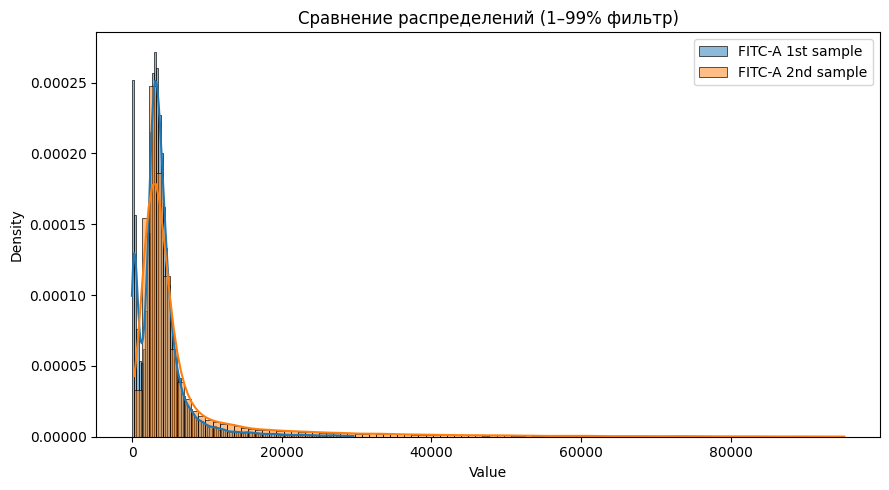


===== Статистика FITC-A 1st sample =====
 count: 4.9e+04
  mean: 3871
median: 3311
   std: 3450
   min: -13.88
   max: 2.959e+04
    1%: 55.63
    5%: 196.2
   25%: 2286
   75%: 4542
   95%: 9522
   99%: 1.993e+04

===== Статистика FITC-A 2nd sample =====
 count: 7.84e+04
  mean: 7139
median: 3595
   std: 1.09e+04
   min: 333
   max: 9.518e+04
    1%: 802
    5%: 1502
   25%: 2520
   75%: 5923
   95%: 2.828e+04
   99%: 6.068e+04


{'sample1': {'count': 49000,
  'mean': 3871.124431428571,
  'median': 3310.61,
  'std': 3449.7418679656425,
  'min': -13.88,
  'max': 29585.88,
  '1%': 55.63,
  '5%': 196.20600000000007,
  '25%': 2286.4375,
  '75%': 4542.06,
  '95%': 9522.44049999998,
  '99%': 19930.3122},
 'sample2': {'count': 78402,
  'mean': 7139.129256906712,
  'median': 3595.0,
  'std': 10898.863581248768,
  'min': 333.0,
  'max': 95183.0,
  '1%': 802.0,
  '5%': 1502.0,
  '25%': 2520.0,
  '75%': 5923.0,
  '95%': 28283.0,
  '99%': 60683.0}}

In [8]:
compare_distributions(df['FITC-A'].values, df2['FITC-A'].values, label1="FITC-A 1st sample", label2="FITC-A 2nd sample")

In [9]:
import numpy as np
import pandas as pd
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt

def asinh_transform(df, cofactor=5.0, cols=None):
    """
    Применяет arcsinh(x/cofactor) ко всем указанным колонкам.
    cofactor: число; типичные значения зависят от платформы (попробуй 5..150).
    """
    if cols is None:
        cols = df.select_dtypes(include=[np.number]).columns
    out = df.copy()
    out.loc[:, cols] = np.arcsinh(out.loc[:, cols] / cofactor)
    return out

def robust_scale_df(df, cols=None):
    """
    Масштабирование: (x - median) / IQR для каждой колонки.
    Устойчиво к выбросам.
    """
    if cols is None:
        cols = df.select_dtypes(include=[np.number]).columns
    out = df.copy()
    for c in cols:
        med = out[c].median()
        iqr = out[c].quantile(0.75) - out[c].quantile(0.25)
        if iqr == 0:
            iqr = out[c].std() if out[c].std() != 0 else 1.0
        out[c] = (out[c] - med) / iqr
    return out

def quantile_map_to_reference(target, reference, cols=None, n_quantiles=1000):
    """
    Для каждой колонки выполняет квантильное сопоставление значений target -> reference.
    target, reference: pandas.DataFrame (одни и те же колонки).
    n_quantiles: число квантилей для интерполяции (чем больше — тем точнее).
    Возвращает нормализованный target DataFrame.
    """
    if cols is None:
        cols = list(set(target.select_dtypes(include=[np.number]).columns) & 
                    set(reference.select_dtypes(include=[np.number]).columns))
    out = target.copy()

    quantiles = np.linspace(0, 1, n_quantiles)
    for c in cols:
        ref_vals = reference[c].dropna().values
        tgt_vals = target[c].dropna().values
        if len(ref_vals) < 2 or len(tgt_vals) < 2:
            continue

        ref_q = np.quantile(ref_vals, quantiles)
        tgt_q = np.quantile(tgt_vals, quantiles)

        # интерполировать: для каждого значения target находим его перцентиль и сопоставляем к референтному квантилию
        # быстрее: построим Ф-образную функцию через np.interp
        # сначала получим для каждого target значение его квантили (интерполяция по tgt_q -> quantiles)
        ranks = np.interp(tgt_vals, tgt_q, quantiles, left=0.0, right=1.0)
        mapped = np.interp(ranks, quantiles, ref_q)
        # записать обратно
        # нужно сохранить индексы: возьмём индексы невпавших в dropna
        tgt_index = target[c].dropna().index
        out.loc[tgt_index, c] = mapped

    return out

def ks_per_channel(df1, df2, cols=None):
    """
    Возвращает KS-statistics и p-value для каждой колонки.
    """
    if cols is None:
        cols = list(set(df1.select_dtypes(include=[np.number]).columns) & 
                    set(df2.select_dtypes(include=[np.number]).columns))
    res = {}
    for c in cols:
        a = df1[c].dropna().values
        b = df2[c].dropna().values
        if len(a) < 2 or len(b) < 2:
            res[c] = (np.nan, np.nan)
            continue
        stat, p = ks_2samp(a, b)
        res[c] = (stat, p)
    return res

def normalize_to_reference_pipeline(target_df, reference_df,
                                    transform='asinh', cofactor=5.0,
                                    scaling='robust', quantile_n=1000,
                                    do_plot=True, cols=None):
    """
    Полный pipeline:
    1) трансформация (asinh или none) одинаково для всех данных
    2) масштабирование (robust / none)
    3) квантильная подгонка target -> reference
    4) вывод KS по каналам и опциональные графики
    """
    if cols is None:
        cols = list(set(target_df.select_dtypes(include=[np.number]).columns) & 
                    set(reference_df.select_dtypes(include=[np.number]).columns))
    # 1) трансформация
    if transform == 'asinh':
        t_target = asinh_transform(target_df, cofactor=cofactor, cols=cols)
        t_ref = asinh_transform(reference_df, cofactor=cofactor, cols=cols)
    else:
        t_target = target_df.copy()
        t_ref = reference_df.copy()

    # 2) масштабирование
    if scaling == 'robust':
        t_target = robust_scale_df(t_target, cols=cols)
        t_ref = robust_scale_df(t_ref, cols=cols)

    # 3) quantile map
    mapped = quantile_map_to_reference(t_target, t_ref, cols=cols, n_quantiles=quantile_n)

    # 4) оценки
    ks_before = ks_per_channel(t_target, t_ref, cols=cols)
    ks_after = ks_per_channel(mapped, t_ref, cols=cols)

    # печать/проверка
    print("KS (stat, p) до и после подгонки (пример первых каналов):")
    for c in cols[:10]:
        print(f"{c}: before={ks_before[c][0]:.4f}, after={ks_after[c][0]:.4f}, p_after={ks_after[c][1]:.3e}")

    # plot (если нужно), пример для первых 6 каналов
    if do_plot:
        nplot = min(6, len(cols))
        sel = cols[:nplot]
        for c in sel:
            plt.figure(figsize=(7,3))
            # исходный target (после трансформации/масштабирования), reference и mapped
            plt.subplot(1,2,1)
            # плотности
            try:
                import seaborn as sns
                sns.kdeplot(t_ref[c].dropna(), label='reference', fill=False)
                sns.kdeplot(t_target[c].dropna(), label='target (transf)', fill=False)
                plt.title(f"{c} (до)")
                plt.legend()
            except Exception:
                plt.hist(t_ref[c].dropna(), bins=80, alpha=0.5, density=True, label='ref')
                plt.hist(t_target[c].dropna(), bins=80, alpha=0.5, density=True, label='tgt')
                plt.legend()
                plt.title(f"{c} (до)")
            plt.subplot(1,2,2)
            try:
                sns.kdeplot(t_ref[c].dropna(), label='reference', fill=False)
                sns.kdeplot(mapped[c].dropna(), label='target (mapped)', fill=False)
                plt.title(f"{c} (после)")
                plt.legend()
            except Exception:
                plt.hist(t_ref[c].dropna(), bins=80, alpha=0.5, density=True, label='ref')
                plt.hist(mapped[c].dropna(), bins=80, alpha=0.5, density=True, label='mapped')
                plt.legend()
                plt.title(f"{c} (после)")
            plt.tight_layout()
            plt.show()

    return mapped, {'ks_before': ks_before, 'ks_after': ks_after}


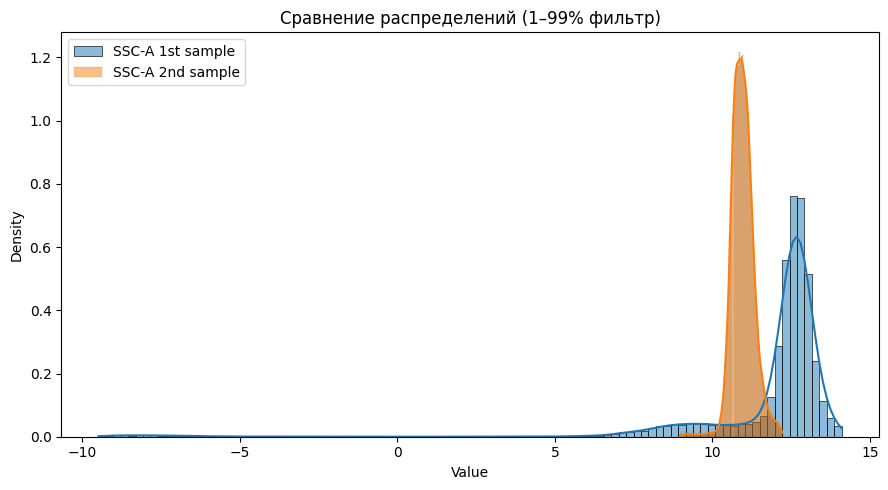


===== Статистика SSC-A 1st sample =====
 count: 4.9e+04
  mean: 11.89
median: 12.57
   std: 2.686
   min: -9.494
   max: 14.1
    1%: -6.92
    5%: 8.431
   25%: 12.12
   75%: 12.89
   95%: 13.39
   99%: 13.82

===== Статистика SSC-A 2nd sample =====
 count: 3.92e+04
  mean: 10.96
median: 10.94
   std: 0.3593
   min: 8.986
   max: 12.22
    1%: 10.1
    5%: 10.47
   25%: 10.73
   75%: 11.16
   95%: 11.57
   99%: 11.96


{'sample1': {'count': 49000,
  'mean': 11.889849816407533,
  'median': 12.566823081370334,
  'std': 2.686086793965034,
  'min': -9.49397858468522,
  'max': 14.101419309011222,
  '1%': -6.920214685624295,
  '5%': 8.4311272891936,
  '25%': 12.120857344551,
  '75%': 12.888515106966782,
  '95%': 13.387981138989351,
  '99%': 13.819429921206664},
 'sample2': {'count': 39200,
  'mean': 10.95859530609774,
  'median': 10.93851020337724,
  'std': 0.35930793754146545,
  'min': 8.985795855415187,
  'max': 12.224134542972665,
  '1%': 10.104908549936551,
  '5%': 10.469620911947374,
  '25%': 10.72862963383582,
  '75%': 11.164643770590203,
  '95%': 11.567133496199983,
  '99%': 11.964508164586217}}

In [10]:
rs1 = asinh_transform(df, 5, "SSC-A")
rs2 = asinh_transform(df2, 5, "SSC-A")
compare_distributions(rs1["SSC-A"].values, rs2["SSC-A"].values, label1="SSC-A 1st sample", label2="SSC-A 2nd sample")

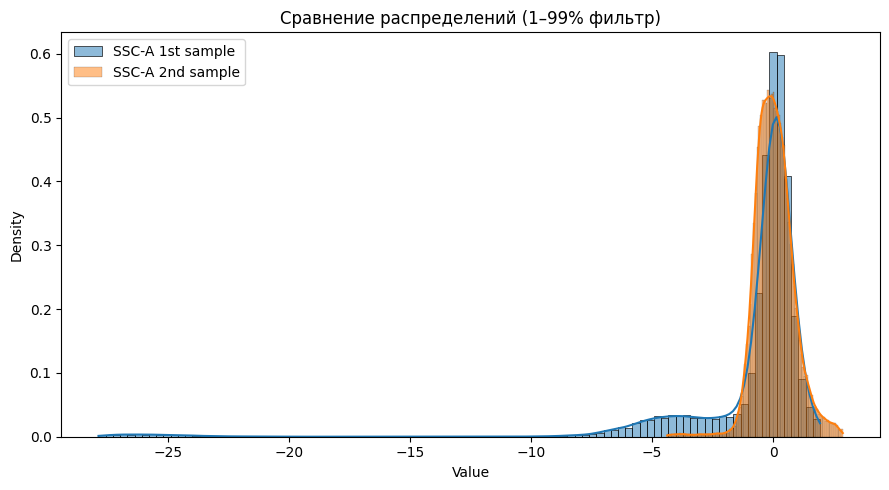


===== Статистика SSC-A 1st sample =====
 count: 4.9e+04
  mean: -0.8555
median: 0
   std: 3.395
   min: -27.88
   max: 1.939
    1%: -24.63
    5%: -5.227
   25%: -0.5636
   75%: 0.4065
   95%: 1.038
   99%: 1.583

===== Статистика SSC-A 2nd sample =====
 count: 3.92e+04
  mean: 0.04502
median: 0
   std: 0.8054
   min: -4.377
   max: 2.882
    1%: -1.869
    5%: -1.051
   25%: -0.4705
   75%: 0.5069
   95%: 1.409
   99%: 2.3


{'sample1': {'count': 49000,
  'mean': -0.8555284642829313,
  'median': 0.0,
  'std': 3.3945560758560274,
  'min': -27.87945218375489,
  'max': 1.9393539182084696,
  '1%': -24.626844747165148,
  '5%': -5.226506943397186,
  '25%': -0.5635915060320965,
  '75%': 0.4065399608442706,
  '95%': 1.0377427415940212,
  '99%': 1.5829883711794104},
 'sample2': {'count': 39200,
  'mean': 0.045022152818421445,
  'median': 0.0,
  'std': 0.8054136987983785,
  'min': -4.377144842527395,
  'max': 2.881816254057229,
  '1%': -1.8685760064641697,
  '5%': -1.0510479148373868,
  '25%': -0.470461874504949,
  '75%': 0.5068940976859054,
  '95%': 1.4091027737586577,
  '99%': 2.299845693783354}}

In [11]:
rs1 = robust_scale_df(rs1, ["SSC-A"])
rs2 = robust_scale_df(rs2, ["SSC-A"])
compare_distributions(rs1["SSC-A"].values, rs2["SSC-A"].values, label1="SSC-A 1st sample", label2="SSC-A 2nd sample")

In [12]:
ks_per_channel(df, df2, cols=["SSC-A"])

{'SSC-A': (0.772895, 0.0)}

In [13]:
compare_distributions(df_q["SSC-A"].values, df2["SSC-A"].values, label1="SSC-A 1st sample", label2="SSC-A 2nd sample")

NameError: name 'df_q' is not defined

In [21]:
df_q_ssca = quantile_map_to_reference(df, df2, cols=["SSC-A"], n_quantiles=10000)
df_q_fsca = quantile_map_to_reference(df, df2, cols=["FSC-A"], n_quantiles=10000)
df_q_fsca["SSC-A"] = df_q_ssca["SSC-A"]
df_q_fsca

,FSC-H,SSC-H,FITC-H,FSC-A,SSC-A,FITC-A
0,170527.0,119387.0,637.0,2.833667e+06,131258.548187,3768.03
1,179163.0,91273.0,478.0,2.997171e+06,117322.432421,2928.31
2,161510.0,143253.0,511.0,2.771351e+06,144730.941380,2784.38
3,194785.0,198536.0,586.0,3.159451e+06,194564.441953,3468.88
4,162182.0,112947.0,558.0,2.905218e+06,130966.476349,3596.72
...,...,...,...,...,...,...
49995,7215.0,2171.0,131.0,1.321531e+06,82113.486742,168.59
49996,147706.0,97694.0,785.0,2.690767e+06,121844.396030,5203.31
49997,164753.0,138055.0,615.0,2.892997e+06,144688.190516,3551.00
49998,21751.0,50112.0,132.0,2.117951e+06,105300.791057,308.34


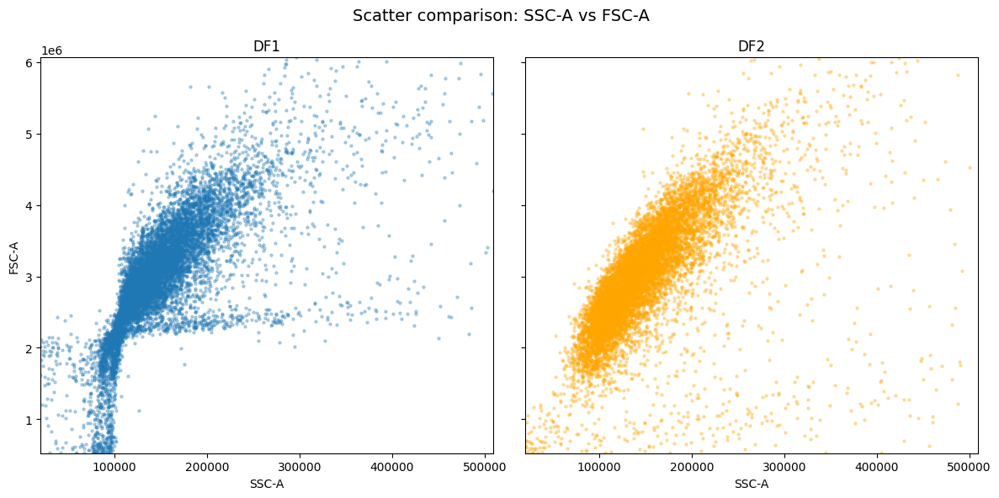

In [22]:
def scatter_compare(df1, df2, x_col, y_col, 
                    sample_size=10000,
                    alpha=0.3,
                    figsize=(12, 6),
                    quantile_filter=True):
    """
    Сравнительный scatter plot двух датафреймов по одинаковым каналам с фильтрацией выбросов.
    
    Параметры:
    - df1, df2: pandas.DataFrame
    - x_col, y_col: колонки для отображения
    - sample_size: подвыборка точек для ускорения отрисовки
    - alpha: прозрачность точек
    - figsize: размер фигуры
    - quantile_filter: если True, фильтруем по 1% и 99% квантилям каждой колонки
    """

    def filter_quantiles(df, cols):
        out = df.copy()
        for c in cols:
            q1 = df[c].quantile(0.01)
            q99 = df[c].quantile(0.99)
            out = out[(out[c] >= q1) & (out[c] <= q99)]
        return out

    # Фильтрация по квантилям
    if quantile_filter:
        df1 = filter_quantiles(df1, [x_col, y_col])
        df2 = filter_quantiles(df2, [x_col, y_col])

    # Подвыборка
    if len(df1) > sample_size:
        df1 = df1.sample(sample_size)
    if len(df2) > sample_size:
        df2 = df2.sample(sample_size)

    x1, y1 = df1[x_col].values, df1[y_col].values
    x2, y2 = df2[x_col].values, df2[y_col].values

    # Общие лимиты по X и Y
    x_min = min(np.min(x1), np.min(x2))
    x_max = max(np.max(x1), np.max(x2))
    y_min = min(np.min(y1), np.min(y2))
    y_max = max(np.max(y1), np.max(y2))

    # Рисуем
    fig, axes = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True)

    axes[0].scatter(x1, y1, s=5, alpha=alpha)
    axes[0].set_title("DF1")
    axes[0].set_xlabel(x_col)
    axes[0].set_ylabel(y_col)

    axes[1].scatter(x2, y2, s=5, alpha=alpha, color='orange')
    axes[1].set_title("DF2")
    axes[1].set_xlabel(x_col)

    # Общие лимиты
    axes[0].set_xlim(x_min, x_max)
    axes[0].set_ylim(y_min, y_max)

    plt.suptitle(f"Scatter comparison: {x_col} vs {y_col}", fontsize=14)
    plt.tight_layout()
    plt.show()

scatter_compare(df_q_fsca, df2, "SSC-A", "FSC-A")

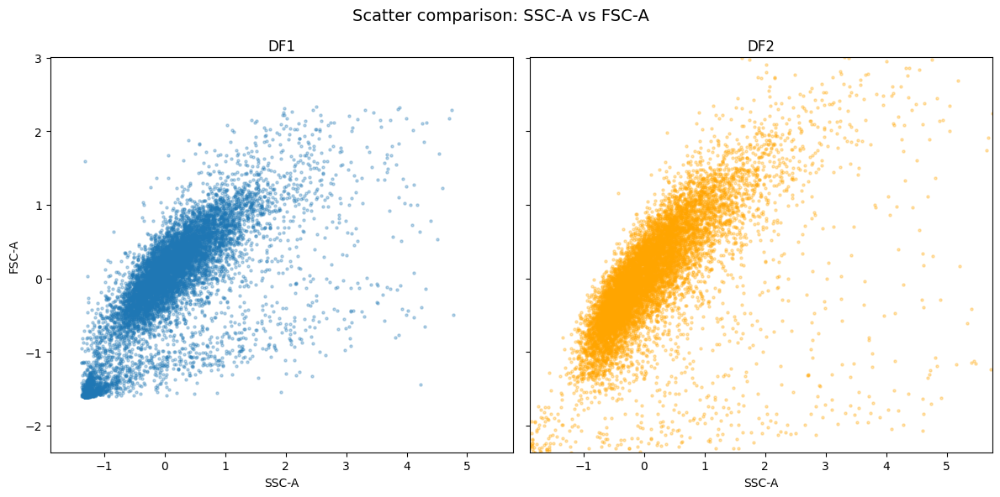

In [16]:
df_r_ssca = robust_scale_df(df, cols=["SSC-A"])
df_r_fsca = robust_scale_df(df, cols=["FSC-A"])

df2_r_ssca = robust_scale_df(df2, cols=["SSC-A"])
df2_r_fsca = robust_scale_df(df2, cols=["FSC-A"])

df_r_fsca["SSC-A"] = df_r_ssca["SSC-A"]
df2_r_fsca["SSC-A"] = df2_r_ssca["SSC-A"]

scatter_compare(df_r_fsca, df2_r_fsca, "SSC-A", "FSC-A")

In [31]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. Проверка уникальности колонок ==

def fix_duplicate_columns(df, name):
    if df.columns.duplicated().any():
        print(f"[!] В {name} найдены дубликаты колонок:")
        print(df.columns[df.columns.duplicated()])
        df = df.loc[:, ~df.columns.duplicated()].copy()
        print(f"[*] Дубликаты удалены.")
    return df


df1 = fix_duplicate_columns(df1, "df1")
df2 = fix_duplicate_columns(df2, "df2")

# === 2. Унификация колонок ===

# получим полное множество колонок
all_cols = sorted(set(df1.columns) | set(df2.columns))

# добавим отсутствующие строки
for col in all_cols:
    if col not in df1.columns:
        df1[col] = np.nan
    if col not in df2.columns:
        df2[col] = np.nan

# упорядочим одинаково
df1 = df1[all_cols].copy()
df2 = df2[all_cols].copy()

# ============ Проверка, что теперь concat безопасен =============
print("\nКолонки совпадают?", df1.columns.equals(df2.columns))

df3 = pd.concat([df1, df2], ignore_index=True)
print("OK: DataFrames concatenated successfully!")

[!] В df2 найдены дубликаты колонок:
Index(['FITC-A'], dtype='object')
[*] Дубликаты удалены.

Колонки совпадают? True
OK: DataFrames concatenated successfully!


In [55]:
def quantile_filter(df, channels, q_low=0.01, q_high=0.99):
    """
    Фильтр по квантилям для всех каналов: выбрасываем значения,
    которые выходят за границы [1%, 99%] распределения *для каждого канала*.
    """
    df_filtered = df.copy()
    mask = pd.Series(True, index=df_filtered.index)

    for ch in channels:
        if ch not in df_filtered.columns:
            print(f"[WARN] Channel '{ch}' отсутствует, пропускаю.")
            continue

        if not np.issubdtype(df_filtered[ch].dtype, np.number):
            print(f"[WARN] Channel '{ch}' не числовой, пропускаю.")
            continue
        
        low = df_filtered[ch].quantile(q_low)
        high = df_filtered[ch].quantile(q_high)

        mask &= df_filtered[ch].between(low, high)
    
    removed = (~mask).sum()
    print(f"[Quartile filter] Removed {removed} rows from {len(df)} ({removed/len(df)*100:.2f}%)")

    return df_filtered[mask].reset_index(drop=True)

df1 = df.copy()
fitc_a = [i[0] for i in df2["FITC-A"].values]
df2 = df2.drop(columns=["FITC-A"])
df2["FITC-A"] = fitc_a

channels1 = [c for c in df1.columns if c not in ["instrument", "label"]]
channels2 = [c for c in df2.columns if c not in ["instrument", "label"]]

# применяем фильтр отдельно к приборам
df1 = quantile_filter(df1, channels1)
df2 = quantile_filter(df2, channels2)

[Quartile filter] Removed 3022 rows from 50000 (6.04%)
[Quartile filter] Removed 2031 rows from 40000 (5.08%)


Используемые каналы: ['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']


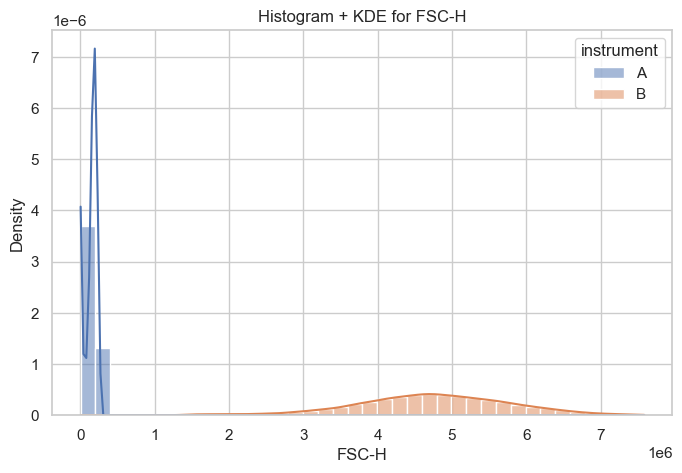

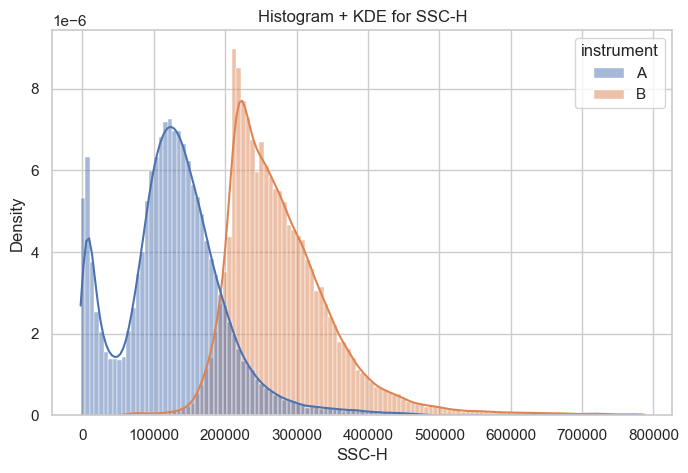

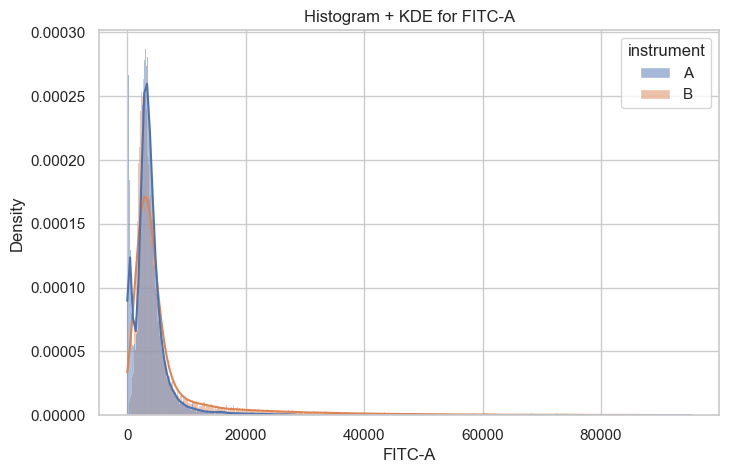

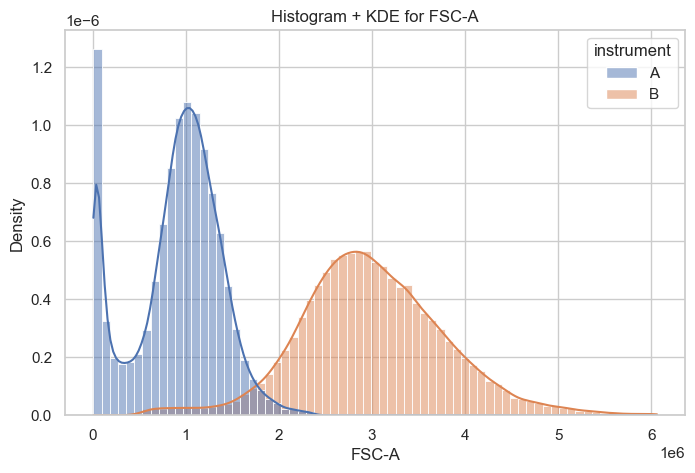

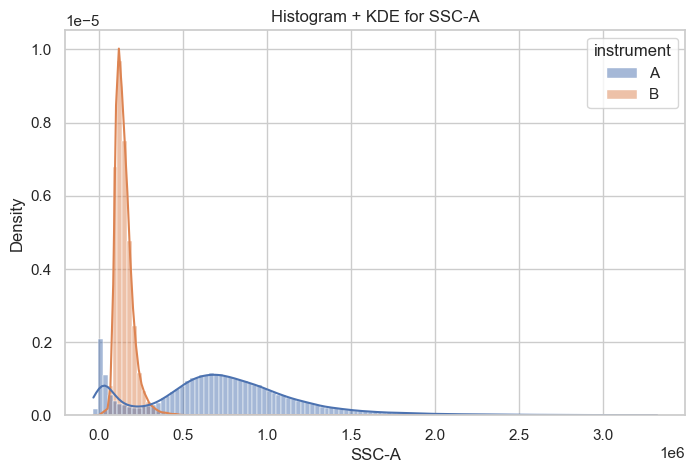

...

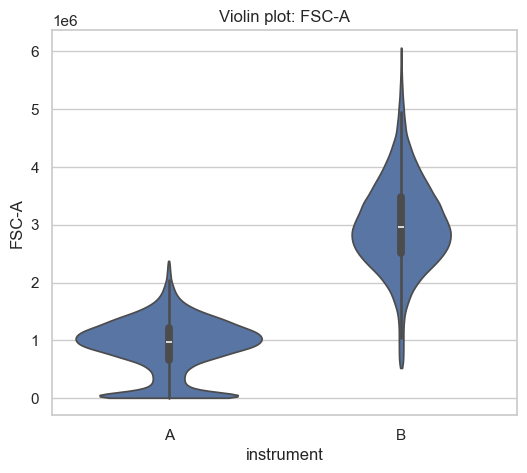

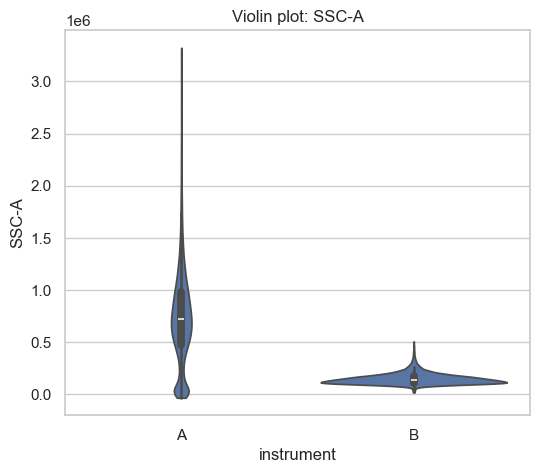

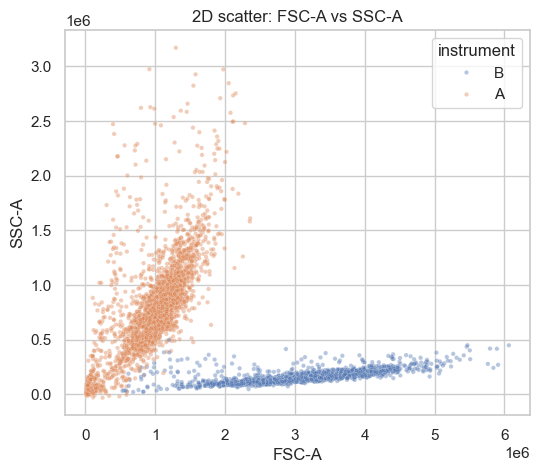

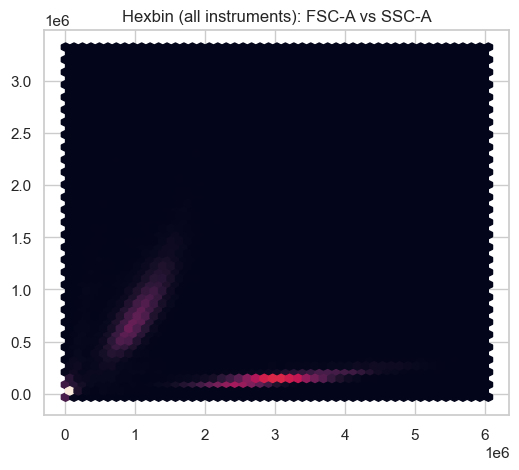

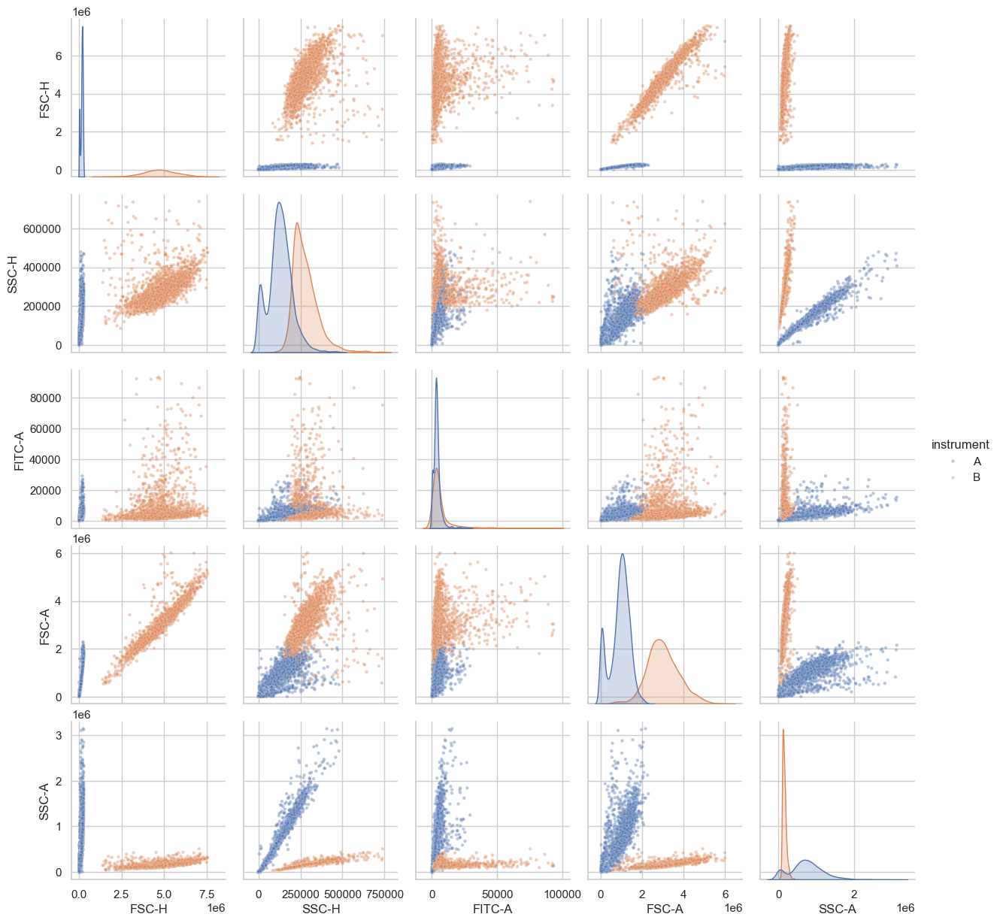

['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']


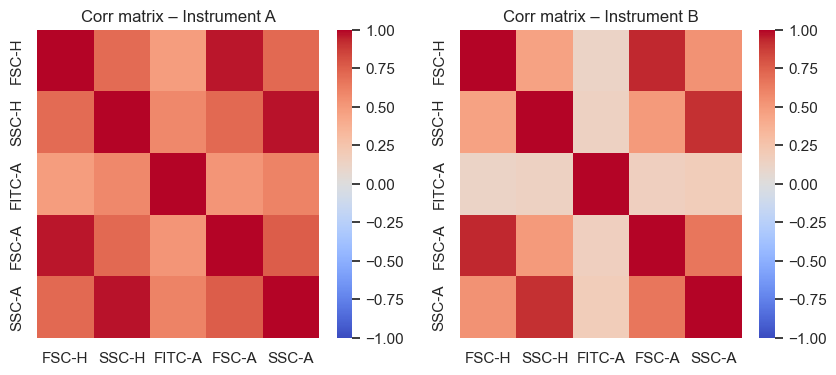

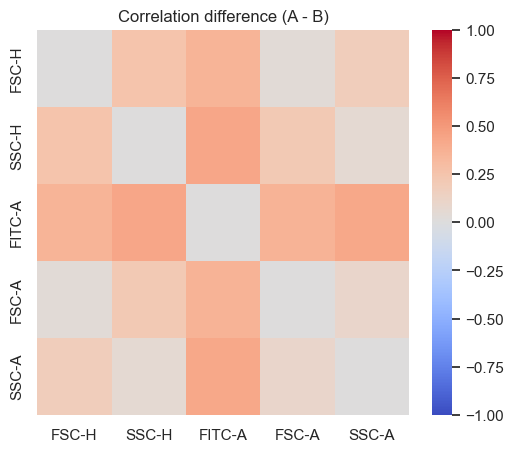


=== DISTRIBUTION DISTANCES ===
  channel        KS        JS  Bhattacharyya  EMD(Wasserstein)
0   FSC-H  1.000000       NaN            NaN      4.596191e+06
1   SSC-H  0.804895  0.656322       8.519730      1.521728e+05
2  FITC-A  0.128310  0.236092       5.066237      3.246407e+03
3   FSC-A  0.933056  0.650378      10.105684      2.097406e+06
4   SSC-A  0.812516  0.742821      10.978870      6.051159e+05


c:\Users\Professional\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import ks_2samp
from scipy.spatial.distance import jensenshannon
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
# ================================================================
# 0) Объединение двух приборов
# ================================================================
df1["instrument"] = "A"
df2["instrument"] = "B"

df1 = df1.reset_index(drop=True).copy()
df2 = df2.reset_index(drop=True).copy()

df3 = pd.concat([df1, df2], ignore_index=True)

channels = ['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']
print("Используемые каналы:", channels)

# ================================================================
# 1) Гистограммы + KDE Overlay
# ================================================================
sns.set(style="whitegrid")
for ch in channels:
    plt.figure(figsize=(8,5))
    sns.histplot(df3, x=ch, hue="instrument", stat="density", common_norm=False, kde=True)
    plt.title(f"Histogram + KDE for {ch}")
    plt.show()

# ================================================================
# 2) Boxplot / Violin
# ================================================================
for ch in channels:
    plt.figure(figsize=(6,5))
    sns.violinplot(data=df3, x="instrument", y=ch, cut=0)
    plt.title(f"Violin plot: {ch}")
    plt.show()

# ================================================================
# 3) 2D scatter / hexbin
# ================================================================
pairs = [("FSC-A","SSC-A"), ("FSC-H","FITC-H"), ("SSC-A","FITC-H")]
for x,y in pairs:
    if x in channels and y in channels:
        plt.figure(figsize=(6,5))
        sns.scatterplot(data=df3.sample(min(5000,len(df3))), x=x, y=y, hue="instrument", alpha=0.4, s=10)
        plt.title(f"2D scatter: {x} vs {y}")
        plt.show()

        plt.figure(figsize=(6,5))
        df_tmp = df3[[x,y,"instrument"]].sample(min(50000, len(df3)))
        plt.hexbin(df_tmp[x], df_tmp[y], gridsize=50)
        plt.title(f"Hexbin (all instruments): {x} vs {y}")
        plt.show()

# ================================================================
# 4) PairGrid для всех каналов
# ================================================================
sns.pairplot(df3.sample(min(5000, len(df3))), vars=channels, hue="instrument", plot_kws={"alpha":0.4, "s":10})
plt.show()

# ================================================================
# 5) Корреляционные матрицы
# ================================================================
print(channels)
corr_A = df1[channels].corr()
corr_B = df2[channels].corr()

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
sns.heatmap(corr_A, vmin=-1, vmax=1, cmap="coolwarm")
plt.title("Corr matrix – Instrument A")

plt.subplot(1,2,2)
sns.heatmap(corr_B, vmin=-1, vmax=1, cmap="coolwarm")
plt.title("Corr matrix – Instrument B")
plt.show()

plt.figure(figsize=(6,5))
sns.heatmap(corr_A - corr_B, vmin=-1, vmax=1, cmap="coolwarm")
plt.title("Correlation difference (A - B)")
plt.show()

# ================================================================
# 6) Статистические расстояния: KS, JS, Bhattacharyya, EMD
# ================================================================
from scipy.stats import wasserstein_distance

dist_table = []

for ch in channels:
    a = df1[ch].dropna().values
    b = df2[ch].dropna().values

    # KS test
    ks = ks_2samp(a, b).statistic

    # Jensen–Shannon divergence
    hist_a, bins = np.histogram(a, bins=200, density=True)
    hist_b, _ = np.histogram(b, bins=bins, density=True)
    js = jensenshannon(hist_a+1e-12, hist_b+1e-12)

    # Bhattacharyya distance
    B = -np.log(np.sum(np.sqrt(hist_a * hist_b)) + 1e-12)

    # Replaced EMD with Wasserstein (1D EMD)
    emd_val = wasserstein_distance(a, b)

    dist_table.append([ch, ks, js, B, emd_val])

dist_df = pd.DataFrame(dist_table, columns=["channel","KS","JS","Bhattacharyya","EMD(Wasserstein)"])
print("\n=== DISTRIBUTION DISTANCES ===")
print(dist_df)


In [65]:
import numpy as np
import pandas as pd
from scipy.stats import ks_2samp, mannwhitneyu, ttest_ind, skew, kurtosis, wasserstein_distance
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, silhouette_score

# ================================================================
# Функция генерации текстового отчета по каналам
# ================================================================
def generate_text_report(df1, df2, channels, label_col=None):
    report_list = []

    # Объединяем для separability
    df_comb = pd.concat([df1, df2], ignore_index=True)
    instruments = ["A", "B"]
    if label_col is None:
        df_comb["instrument_label"] = df_comb.apply(lambda x: 0 if x.name < len(df1) else 1, axis=1)
    else:
        df_comb["instrument_label"] = df_comb[label_col]

    # Стандартизируем данные для silhouette
    X_scaled = StandardScaler().fit_transform(df_comb[channels].fillna(0))

    # silhouette по instrument
    try:
        sil_score = silhouette_score(X_scaled, df_comb["instrument_label"])
    except:
        sil_score = np.nan

    print(f"\n=== GLOBAL SEPARABILITY METRICS ===")
    print(f"Silhouette score (instrument separation) = {sil_score:.3f}\n")

    for ch in channels:
        a = df1[ch].dropna().values
        b = df2[ch].dropna().values

        # Базовая статистика
        stats_a = {
            "mean": np.mean(a),
            "median": np.median(a),
            "std": np.std(a),
            "min": np.min(a),
            "max": np.max(a),
            "q01": np.quantile(a, 0.01),
            "q99": np.quantile(a, 0.99),
            "skew": skew(a),
            "kurtosis": kurtosis(a)
        }
        stats_b = {
            "mean": np.mean(b),
            "median": np.median(b),
            "std": np.std(b),
            "min": np.min(b),
            "max": np.max(b),
            "q01": np.quantile(b, 0.01),
            "q99": np.quantile(b, 0.99),
            "skew": skew(b),
            "kurtosis": kurtosis(b)
        }

        # Различия
        mean_diff = stats_b["mean"] - stats_a["mean"]
        median_diff = stats_b["median"] - stats_a["median"]
        perc_diff = 100 * mean_diff / stats_a["mean"] if stats_a["mean"] != 0 else np.nan

        # Статистические тесты
        ks = ks_2samp(a, b).statistic
        mw = mannwhitneyu(a, b, alternative='two-sided').statistic
        t_stat, t_p = ttest_ind(a, b, equal_var=False)

        # Wasserstein distance
        emd_val = wasserstein_distance(a, b)

        # ROC AUC (по предсказанию прибора)
        X_ch = df_comb[[ch]].fillna(0)
        y = df_comb["instrument_label"]
        try:
            clf = LogisticRegression(max_iter=200)
            clf.fit(X_ch, y)
            y_prob = clf.predict_proba(X_ch)[:,1]
            auc = roc_auc_score(y, y_prob)
        except:
            auc = np.nan

        # Формируем текст
        text = f"""
===== {ch} =====
Mean(A) = {stats_a['mean']:.2f}, Mean(B) = {stats_b['mean']:.2f} ({perc_diff:+.1f}%)
Median(A) = {stats_a['median']:.2f}, Median(B) = {stats_b['median']:.2f} (Δ={median_diff:.2f})
Std(A) = {stats_a['std']:.2f}, Std(B) = {stats_b['std']:.2f}
1%-99% quantiles: A=({stats_a['q01']:.2f}-{stats_a['q99']:.2f}), B=({stats_b['q01']:.2f}-{stats_b['q99']:.2f})
Skewness: A={stats_a['skew']:.2f}, B={stats_b['skew']:.2f}
Kurtosis: A={stats_a['kurtosis']:.2f}, B={stats_b['kurtosis']:.2f}
KS-stat = {ks:.3f}, Mann-Whitney U = {mw:.3f}, t-test p-value = {t_p:.3e}
Wasserstein distance (1D EMD) = {emd_val:.3f}
ROC AUC (instrument classifier) = {auc:.3f}
"""
        print(text)
        report_list.append({
            "channel": ch,
            "mean_A": stats_a['mean'],
            "mean_B": stats_b['mean'],
            "median_A": stats_a['median'],
            "median_B": stats_b['median'],
            "std_A": stats_a['std'],
            "std_B": stats_b['std'],
            "perc_diff_mean": perc_diff,
            "ks": ks,
            "mannwhitneyU": mw,
            "t_pvalue": t_p,
            "emd_wasserstein": emd_val,
            "roc_auc": auc,
            "skew_A": stats_a['skew'],
            "skew_B": stats_b['skew'],
            "kurtosis_A": stats_a['kurtosis'],
            "kurtosis_B": stats_b['kurtosis']
        })

    summary_df = pd.DataFrame(report_list)
    return summary_df

# ================================================================
# Использование функции
# ================================================================
summary_df = generate_text_report(df1, df2, channels)
# Сохраняем в CSV для дальнейшего анализа
summary_df.to_csv("summary_report.csv", index=False)
print("\n[INFO] Summary saved to 'summary_report.csv'")



=== GLOBAL SEPARABILITY METRICS ===
Silhouette score (instrument separation) = 0.560


===== FSC-H =====
Mean(A) = 154259.34, Mean(B) = 4750450.22 (+2979.5%)
Median(A) = 172056.00, Median(B) = 4760043.00 (Δ=4587987.00)
Std(A) = 72287.35, Std(B) = 1030615.73
1%-99% quantiles: A=(5915.08-267990.92), B=(1912765.60-7058064.76)
Skewness: A=-0.76, B=-0.22
Kurtosis: A=-0.40, B=0.25
KS-stat = 1.000, Mann-Whitney U = 0.000, t-test p-value = 0.000e+00
Wasserstein distance (1D EMD) = 4596190.873
ROC AUC (instrument classifier) = 1.000


===== SSC-H =====
Mean(A) = 126545.58, Mean(B) = 278718.40 (+120.3%)
Median(A) = 125733.50, Median(B) = 263077.00 (Δ=137343.50)
Std(A) = 72685.83, Std(B) = 77404.38
1%-99% quantiles: A=(1288.54-355473.68), B=(161744.28-564027.48)
Skewness: A=0.60, B=1.76
Kurtosis: A=1.52, B=5.78
KS-stat = 0.805, Mann-Whitney U = 95832399.000, t-test p-value = 0.000e+00
Wasserstein distance (1D EMD) = 152172.822
ROC AUC (instrument classifier) = 0.946


===== FITC-A =====
Mean(A) 


===== METHOD: robust =====
  channel    mean_A    mean_B      median_A  median_B        KS  Wasserstein  \
0   FSC-H -0.207917 -0.007170  0.000000e+00       0.0  0.114007     0.209839   
1   SSC-H  0.010313  0.176388  0.000000e+00       0.0  0.132914     0.169312   
2  FITC-A  0.217511  1.084300  1.061785e-16       0.0  0.159479     0.866997   
3   FSC-A -0.126903  0.047114  1.048335e-16       0.0  0.116553     0.187751   
4   SSC-A  0.045496  0.172872  1.146883e-16       0.0  0.128610     0.131178   

    ROC_AUC  
0  0.540335  
1  0.530072  
2  0.549532  
3  0.534254  
4  0.525362  

===== METHOD: log+robust =====
  channel    mean_A    mean_B      median_A  median_B        KS  Wasserstein  \
0   FSC-H -0.720948 -0.102389  0.000000e+00       0.0  0.130119     0.620502   
1   SSC-H -0.566217  0.073458  1.377303e-15       0.0  0.146850     0.641849   
2  FITC-A -0.357479  0.227114  0.000000e+00       0.0  0.138899     0.584605   
3   FSC-A -0.720936 -0.070200  1.468312e-15       0.0  

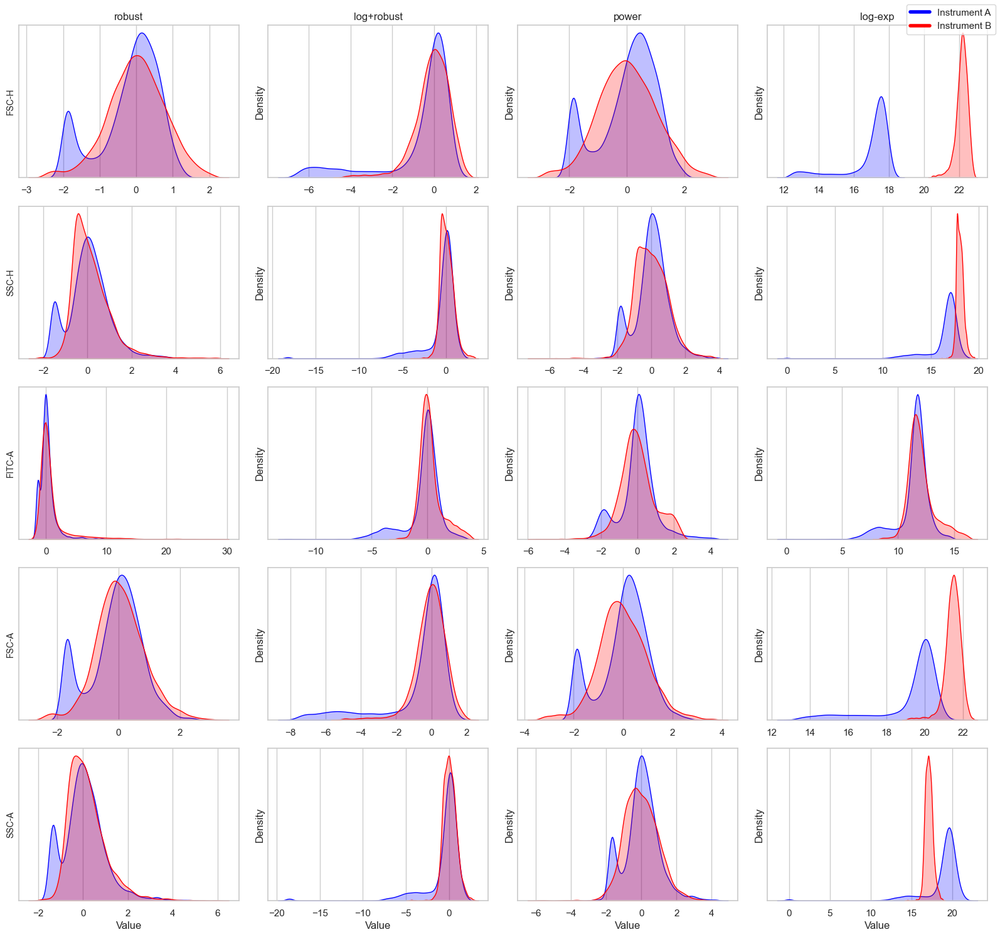

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import RobustScaler, PowerTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from scipy.stats import ks_2samp
from scipy.stats import wasserstein_distance

# ==== Функции для трансформаций ====
def safe_log1p(x, shift=1e-6):
    return np.log1p(np.maximum(x, 0) + shift)

def log_transform(df, channels):
    df_log = df.copy()
    for ch in channels:
        df_log[ch] = safe_log1p(df_log[ch])
    return df_log

def robust_scale(df, channels):
    df_scaled = df.copy()
    scaler = RobustScaler()
    df_scaled[channels] = scaler.fit_transform(df_scaled[channels])
    return df_scaled

def power_transform(df, channels):
    df_scaled = df.copy()
    pt = PowerTransformer(method='yeo-johnson', standardize=True)
    df_scaled[channels] = pt.fit_transform(df_scaled[channels])
    return df_scaled

def log_exp_scale(df, channels, alpha_dict, shift=1e-6):
    df_scaled = df.copy()
    for ch in channels:
        alpha = alpha_dict.get(ch, 1.0)
        df_scaled[ch] = safe_log1p(alpha*df_scaled[ch], shift)/safe_log1p(alpha, shift)
    return df_scaled

# ==== Статистика каналов ====
def channel_stats(df1, df2, channels):
    stats = []
    for ch in channels:
        a = df1[ch].dropna()
        b = df2[ch].dropna()
        ks = ks_2samp(a, b).statistic
        wd = wasserstein_distance(a, b)
        X = pd.concat([a,b]).values.reshape(-1,1)
        y = np.array([0]*len(a) + [1]*len(b))
        clf = LogisticRegression(max_iter=1000).fit(X,y)
        auc = roc_auc_score(y, clf.predict_proba(X)[:,1])
        stats.append([ch, a.mean(), b.mean(), a.median(), b.median(), ks, wd, auc])
    return pd.DataFrame(stats, columns=["channel","mean_A","mean_B","median_A","median_B","KS","Wasserstein","ROC_AUC"])

# ==== Визуализация ====
def plot_scatter_density(df1, df2, channels, sample_size=5000):
    sns.set(style="whitegrid")
    for ch in channels:
        plt.figure(figsize=(8,5))
        sns.kdeplot(df1[ch].sample(min(len(df1), sample_size)), color="blue", label="Instrument A", fill=True)
        sns.kdeplot(df2[ch].sample(min(len(df2), sample_size)), color="red", label="Instrument B", fill=True)
        plt.title(f"Density: {ch}")
        plt.xlabel(ch)
        plt.ylabel("Density")
        plt.legend()
        plt.show()

def plot_density_comparison(df1, df2, channels, methods, sample_size=5000):
    """
    Визуализация всех методов в виде сабплотов:
      - колонки: методы
      - ряды: каналы
    """
    n_methods = len(methods)
    n_channels = len(channels)
    sns.set(style="whitegrid")

    fig, axes = plt.subplots(n_channels, n_methods, figsize=(4*n_methods, 3*n_channels), squeeze=False)

    for col_idx, (method_name, func) in enumerate(methods.items()):
        df1_t = func(df1, channels)
        df2_t = func(df2, channels)
        
        for row_idx, ch in enumerate(channels):
            ax = axes[row_idx, col_idx]
            # KDE плотности
            sns.kdeplot(df1_t[ch].sample(min(len(df1_t), sample_size)), color="blue", label="Instrument A", fill=True, ax=ax)
            sns.kdeplot(df2_t[ch].sample(min(len(df2_t), sample_size)), color="red", label="Instrument B", fill=True, ax=ax)
            if row_idx == 0:
                ax.set_title(method_name, fontsize=12)
            if col_idx == 0:
                ax.set_ylabel(ch, fontsize=10)
            ax.set_xlabel("")
            ax.set_yticks([])
            ax.legend().set_visible(False)
    
    # Общий лейбл для осей X
    for ax in axes[-1, :]:
        ax.set_xlabel("Value")
    # Легенда
    handles = [plt.Line2D([0], [0], color='blue', lw=4),
               plt.Line2D([0], [0], color='red', lw=4)]
    labels = ['Instrument A', 'Instrument B']
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

# ==== Подготовка ====
df1 = df1.reset_index(drop=True)
df2 = df2.reset_index(drop=True)
channels = ['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']

# ==== Альфа для log-exp (пример, можно подбирать отдельно) ====
alpha_dict = {ch:1.0 for ch in channels}  # можно подбирать по 1-99% квантилю для адаптивной нормализации

# ==== Применение методов ====
methods = {
    "robust": robust_scale,
    "log+robust": lambda df,ch: robust_scale(log_transform(df,ch), ch),
    "power": power_transform,
    "log-exp": lambda df,ch: log_exp_scale(df,ch, alpha_dict)
}

for name, func in methods.items():
    print(f"\n===== METHOD: {name} =====")
    df1_t = func(df1, channels)
    df2_t = func(df2, channels)
    stats_df = channel_stats(df1_t, df2_t, channels)
    print(stats_df)

plot_density_comparison(df1, df2, channels, methods)

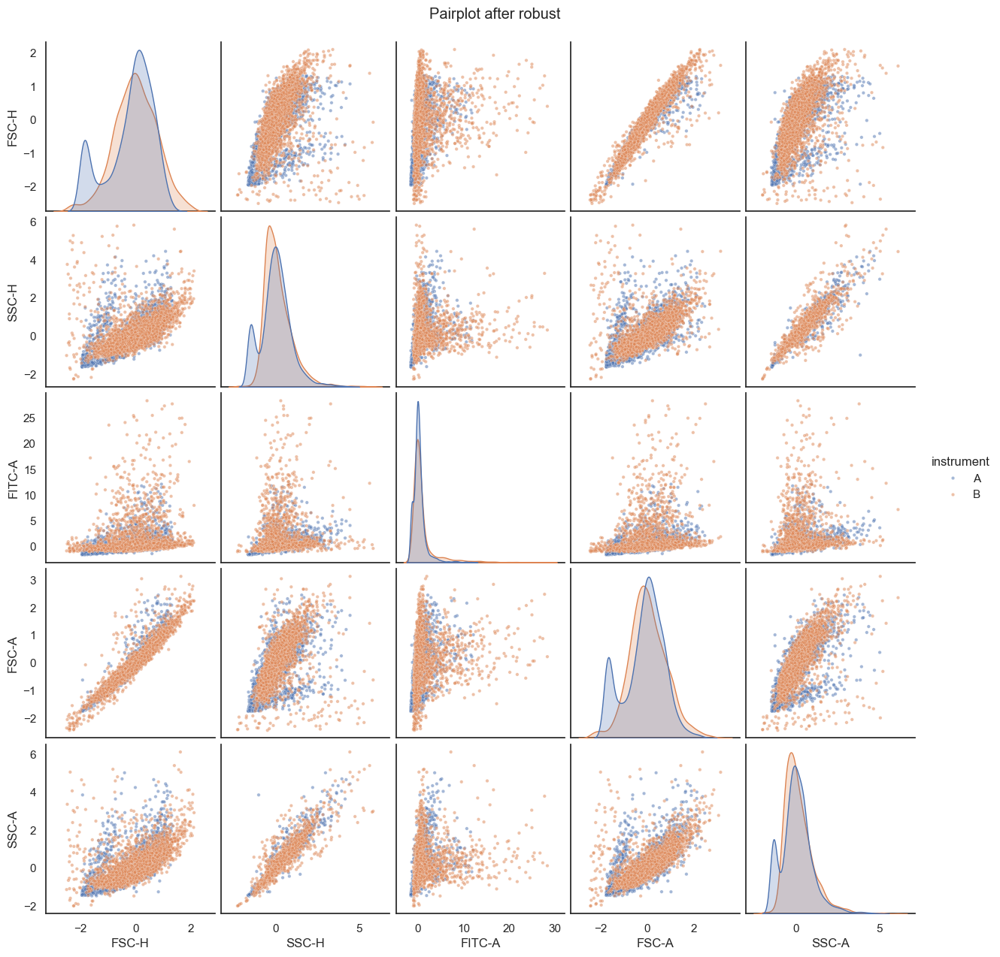

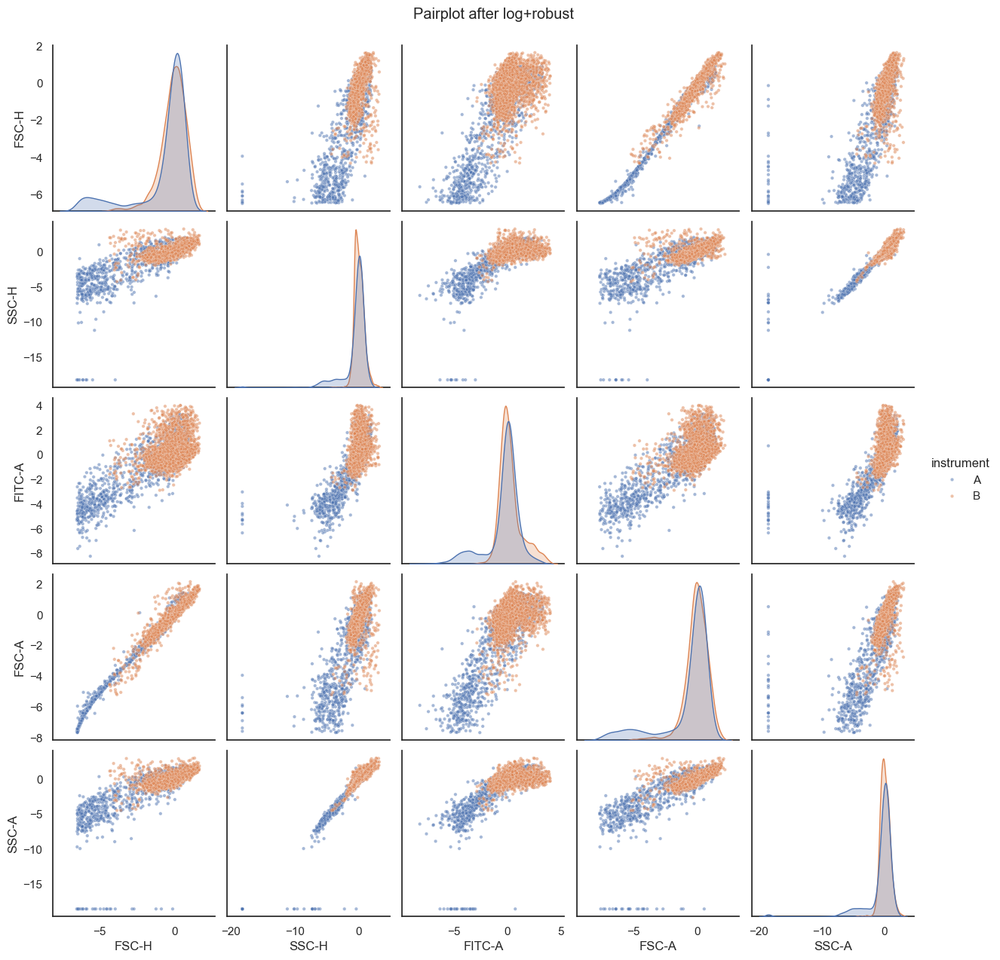

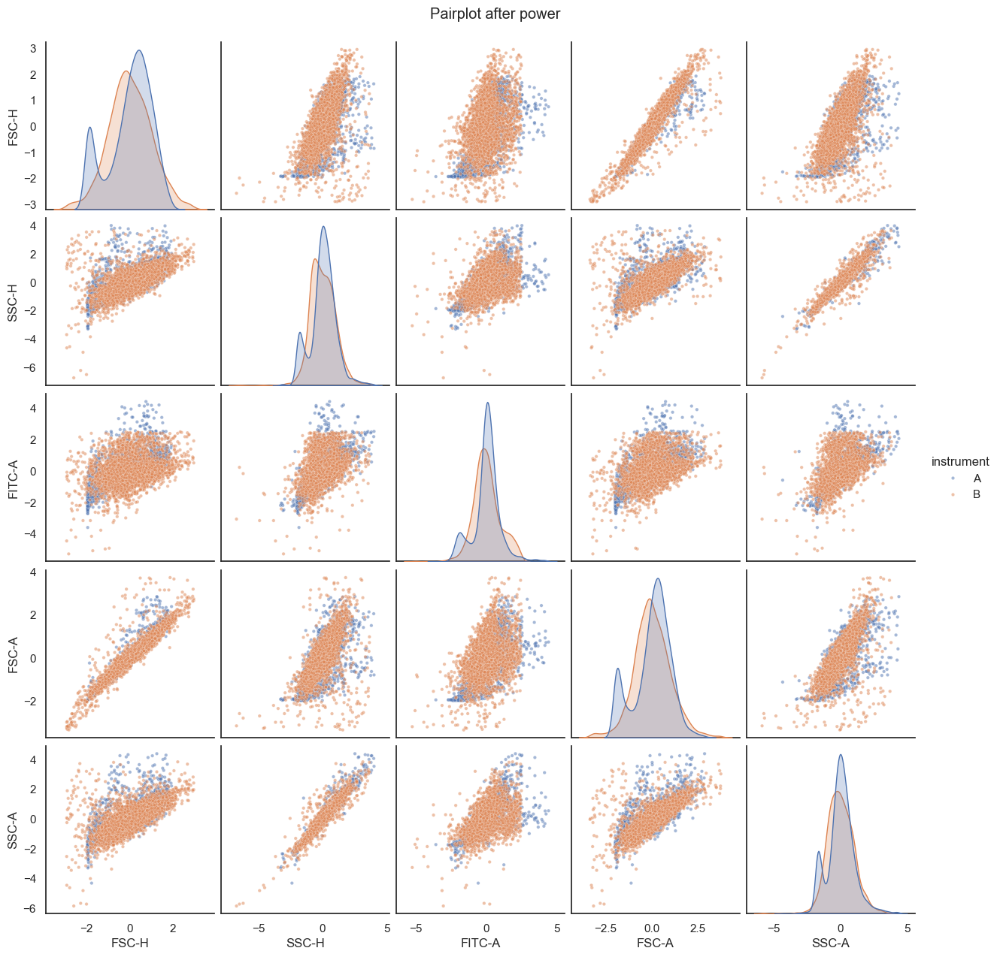

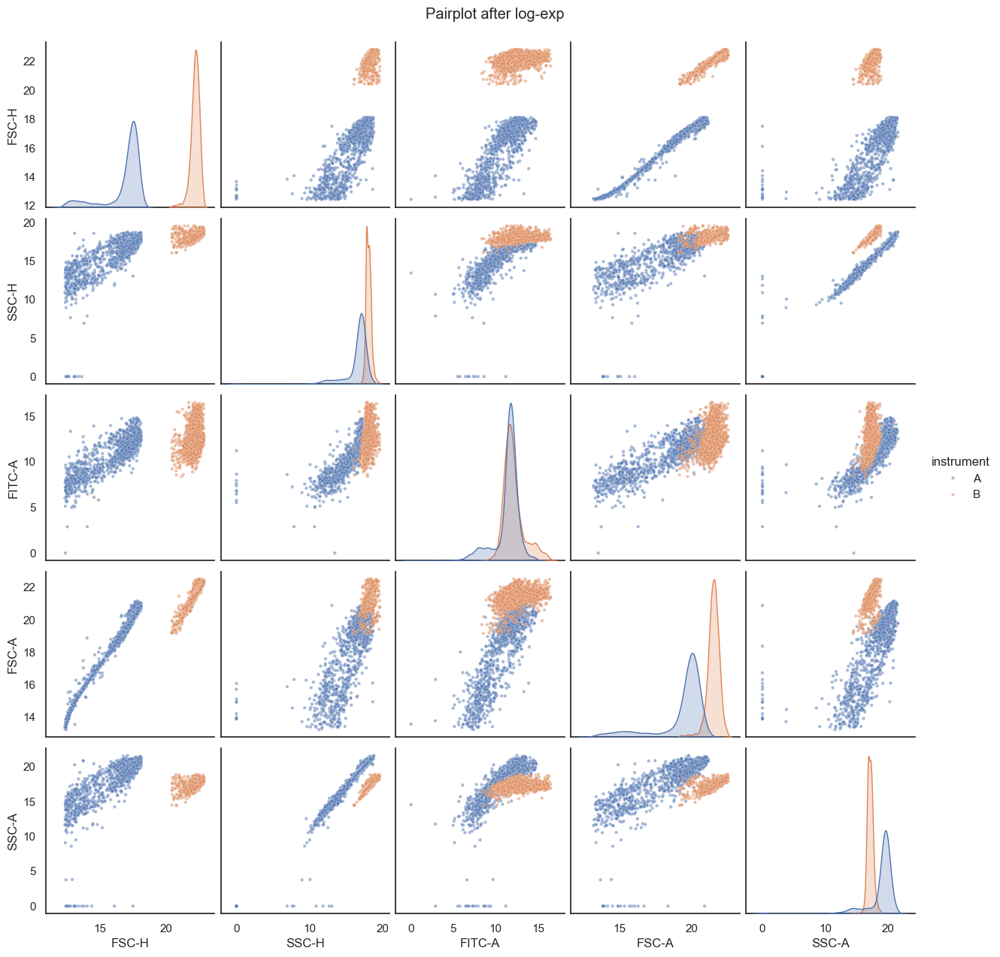

In [72]:
# ==== Функция для построения матрицы scatter ====
def plot_pairgrid(df1, df2, channels, method_name, sample_size=3000):
    # Ограничим количество точек для скорости
    df1_sample = df1.sample(min(len(df1), sample_size)).copy()
    df2_sample = df2.sample(min(len(df2), sample_size)).copy()
    
    df1_sample["instrument"] = "A"
    df2_sample["instrument"] = "B"
    
    df_plot = pd.concat([df1_sample, df2_sample], ignore_index=True)
    
    sns.set(style="white")
    g = sns.pairplot(df_plot, vars=channels, hue="instrument", plot_kws={"alpha":0.5, "s":10})
    g.fig.suptitle(f"Pairplot after {method_name}", y=1.02)
    plt.show()

# ==== Применение для каждого метода ====
methods = {
    "robust": robust_scale,
    "log+robust": lambda df,ch: robust_scale(log_transform(df,ch), ch),
    "power": power_transform,
    "log-exp": lambda df,ch: log_exp_scale(df,ch, alpha_dict)
}

for name, func in methods.items():
    df1_t = func(df1, channels)
    df2_t = func(df2, channels)
    plot_pairgrid(df1_t, df2_t, channels, name)

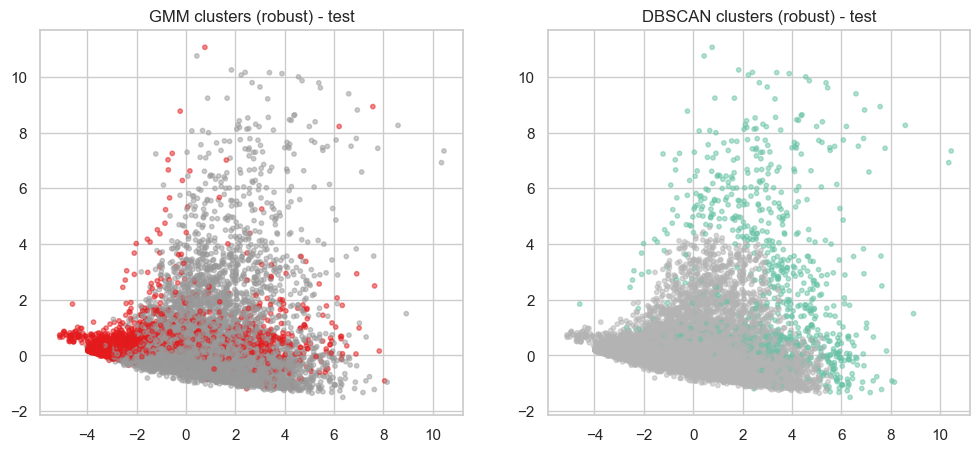

=== robust ===
GMM train: 1    48976
0    10486
Name: count, dtype: int64
GMM test: 1    21082
0     4403
Name: count, dtype: int64
DBSCAN train:  0    58150
-1     1312
Name: count, dtype: int64
DBSCAN test:  0    24575
-1      910
Name: count, dtype: int64


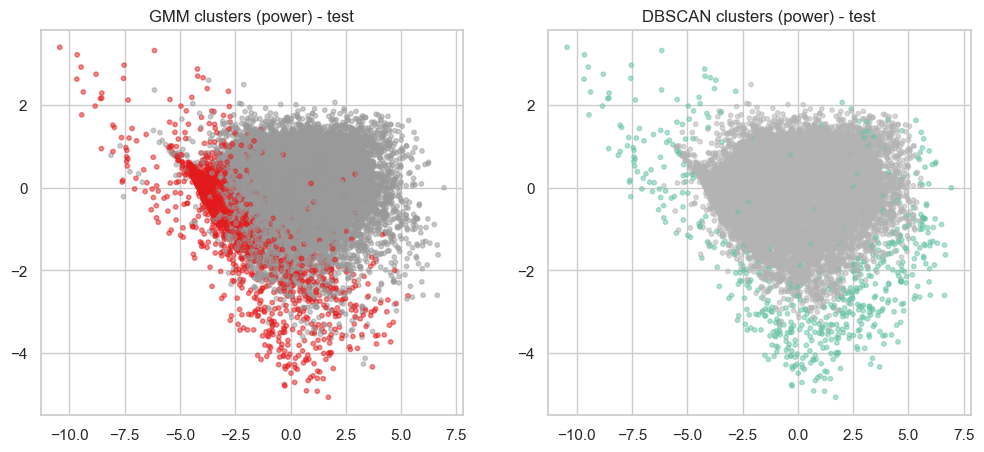

=== power ===
GMM train: 1    51705
0     7757
Name: count, dtype: int64
GMM test: 1    22178
0     3307
Name: count, dtype: int64
DBSCAN train:  0    58505
-1      957
Name: count, dtype: int64
DBSCAN test:  0    24817
-1      668
Name: count, dtype: int64


In [90]:
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

best_methods = {
    "robust": robust_scale,
    "power": power_transform
}

results = {}

for name, func in best_methods.items():
    # Преобразуем каждый датафрейм
    df1_t = func(df1, channels)
    df2_t = func(df2, channels)
    
    # Добавим колонку для идентификации исходного инструмента (не для кластеризации)
    df1_t["_instrument"] = "A"
    df2_t["_instrument"] = "B"
    
    # Объединяем и перемешиваем строки
    df_combined = pd.concat([df1_t, df2_t], ignore_index=True).sample(frac=1, random_state=42).reset_index(drop=True)
    
    # Сохраняем для анализа
    results[name] = df_combined

    
for method_name, df_combined in results.items():
    X = df_combined[channels].values
    y_true = df_combined["_instrument"].values  # метки для анализа
    
    # Делим на train/test
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_true, test_size=0.3, random_state=42, stratify=y_true
    )
    
    # ==== StandardScaler один раз ====
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)  # используем тот же scaler
    
    # ==== GMM ====
    gmm = GaussianMixture(n_components=2, random_state=42, tol=1e-4, covariance_type="diag")
    gmm.fit(X_train_scaled)
    gmm_labels_train = gmm.predict(X_train_scaled)
    gmm_labels_test = gmm.predict(X_test_scaled)
    
    # ==== DBSCAN ====
    dbscan = DBSCAN(eps=1, min_samples=100)
    db_labels_train = dbscan.fit_predict(X_train_scaled)
    db_labels_test = dbscan.fit_predict(X_test_scaled)
    
    # ==== PCA для визуализации теста ====
    X_test_pca = PCA(n_components=2).fit_transform(X_test_scaled)
    
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.scatter(X_test_pca[:,0], X_test_pca[:,1], c=gmm_labels_test, cmap="Set1", s=10, alpha=0.5)
    plt.title(f"GMM clusters ({method_name}) - test")
    
    plt.subplot(1,2,2)
    plt.scatter(X_test_pca[:,0], X_test_pca[:,1], c=db_labels_test, cmap="Set2", s=10, alpha=0.5)
    plt.title(f"DBSCAN clusters ({method_name}) - test")
    
    plt.show()
    
    # ==== Статистика ====
    print(f"=== {method_name} ===")
    print("GMM train:", pd.Series(gmm_labels_train).value_counts())
    print("GMM test:", pd.Series(gmm_labels_test).value_counts())
    print("DBSCAN train:", pd.Series(db_labels_train).value_counts())
    print("DBSCAN test:", pd.Series(db_labels_test).value_counts())


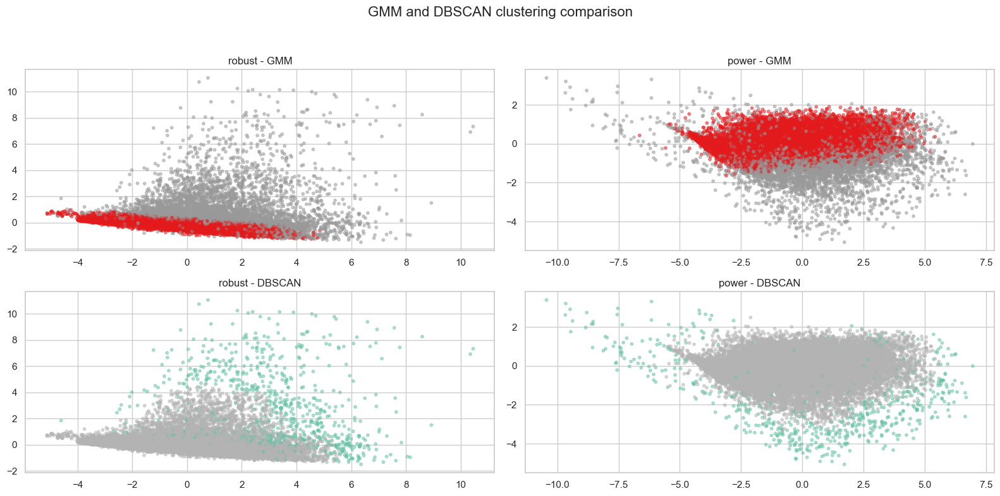

=== robust ===
GMM cluster counts: 1    66618
0    18329
Name: count, dtype: int64
DBSCAN cluster counts:  0    83547
-1     1400
Name: count, dtype: int64
GMM ARI: 0.03777467875991642
DBSCAN ARI: 0.00547898077350438
GMM AMI: 0.025165855608505865
DBSCAN AMI: 0.011822094134076875
=== power ===
GMM cluster counts: 1    66802
0    18145
Name: count, dtype: int64
DBSCAN cluster counts:  0    83983
-1      964
Name: count, dtype: int64
GMM ARI: 0.049000418321838525
DBSCAN ARI: 0.003230016337747589
GMM AMI: 0.03541078810915417
DBSCAN AMI: 0.0063927088760621165


In [91]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, RobustScaler, PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

# ==== Настройки параметров ====
params = {
    "test_size": 0.3,
    "random_state": 42,
    "dbscan_eps": 1,
    "dbscan_min_samples": 100,
    "gmm_components": 2,
    "scaler": StandardScaler(),  # можно заменить на RobustScaler() или др.
    "pca_components": 2,
    "figsize": (16, 8),
}

# results = {"robust": df_robust_combined, "power": df_power_combined}  
# словарь датафреймов после преобразований, должен содержать все каналы и столбец "_instrument" с метками

methods = list(results.keys())
n_methods = len(methods)
fig, axes = plt.subplots(nrows=2, ncols=n_methods, figsize=params["figsize"])
fig.suptitle("GMM and DBSCAN clustering comparison", fontsize=16)

for i, (method_name, df_combined) in enumerate(results.items()):
    channels = ['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']
    X = df_combined[channels].values
    y_true = df_combined["_instrument"].values  # метки инструментов
    
    # ==== Train/Test split ====
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_true,
        test_size=params["test_size"],
        random_state=params["random_state"],
        stratify=y_true
    )
    
    # ==== Масштабирование ====
    scaler = params["scaler"]
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # ==== GMM ====
    gmm = GaussianMixture(n_components=params["gmm_components"], random_state=params["random_state"])
    gmm.fit(X_train_scaled)
    gmm_labels_test = gmm.predict(X_test_scaled)
    
    # ==== DBSCAN ====
    dbscan = DBSCAN(eps=params["dbscan_eps"], min_samples=params["dbscan_min_samples"])
    db_labels_test = dbscan.fit_predict(X_test_scaled)
    
    # ==== PCA для визуализации ====
    X_test_pca = PCA(n_components=params["pca_components"]).fit_transform(X_test_scaled)
    
    # ==== Графики ====
    ax_gmm = axes[0, i]
    ax_db = axes[1, i]
    
    ax_gmm.scatter(X_test_pca[:,0], X_test_pca[:,1], c=gmm_labels_test, cmap="Set1", s=10, alpha=0.5)
    ax_gmm.set_title(f"{method_name} - GMM")
    
    ax_db.scatter(X_test_pca[:,0], X_test_pca[:,1], c=db_labels_test, cmap="Set2", s=10, alpha=0.5)
    ax_db.set_title(f"{method_name} - DBSCAN")
    
plt.tight_layout(rect=[0,0,1,0.95])
plt.show()

# ==== Статистика и метрики качества ====
for method_name, df_combined in results.items():
    channels = ['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']
    X = df_combined[channels].values
    y_true = df_combined["_instrument"].values
    X_scaled = params["scaler"].fit_transform(X)
    
    # GMM
    gmm = GaussianMixture(n_components=params["gmm_components"], random_state=params["random_state"])
    gmm_labels = gmm.fit_predict(X_scaled)
    
    # DBSCAN
    dbscan = DBSCAN(eps=params["dbscan_eps"], min_samples=params["dbscan_min_samples"])
    db_labels = dbscan.fit_predict(X_scaled)
    
    print(f"=== {method_name} ===")
    print("GMM cluster counts:", pd.Series(gmm_labels).value_counts())
    print("DBSCAN cluster counts:", pd.Series(db_labels).value_counts())
    print("GMM ARI:", adjusted_rand_score(y_true, gmm_labels))
    print("DBSCAN ARI:", adjusted_rand_score(y_true, db_labels))
    print("GMM AMI:", adjusted_mutual_info_score(y_true, gmm_labels))
    print("DBSCAN AMI:", adjusted_mutual_info_score(y_true, db_labels))

=== robust ===
GMM cluster counts: 1    66618
0    18329
Name: count, dtype: int64
DBSCAN cluster counts:   0    83547
-1     1400
Name: count, dtype: int64
GMM ARI: 0.03777467875991642
DBSCAN ARI: 0.00547898077350438
GMM AMI: 0.025165855608505865
DBSCAN AMI: 0.011822094134076875
=== power ===
GMM cluster counts: 1    66802
0    18145
Name: count, dtype: int64
DBSCAN cluster counts:   0    83983
-1      964
Name: count, dtype: int64
GMM ARI: 0.049000418321838525
DBSCAN ARI: 0.003230016337747589
GMM AMI: 0.03541078810915417
DBSCAN AMI: 0.0063927088760621165


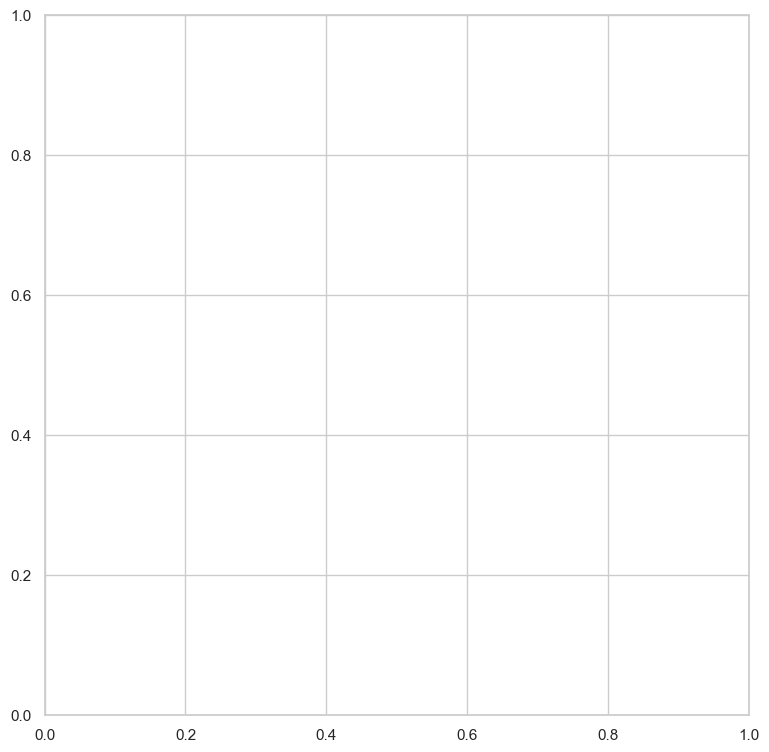

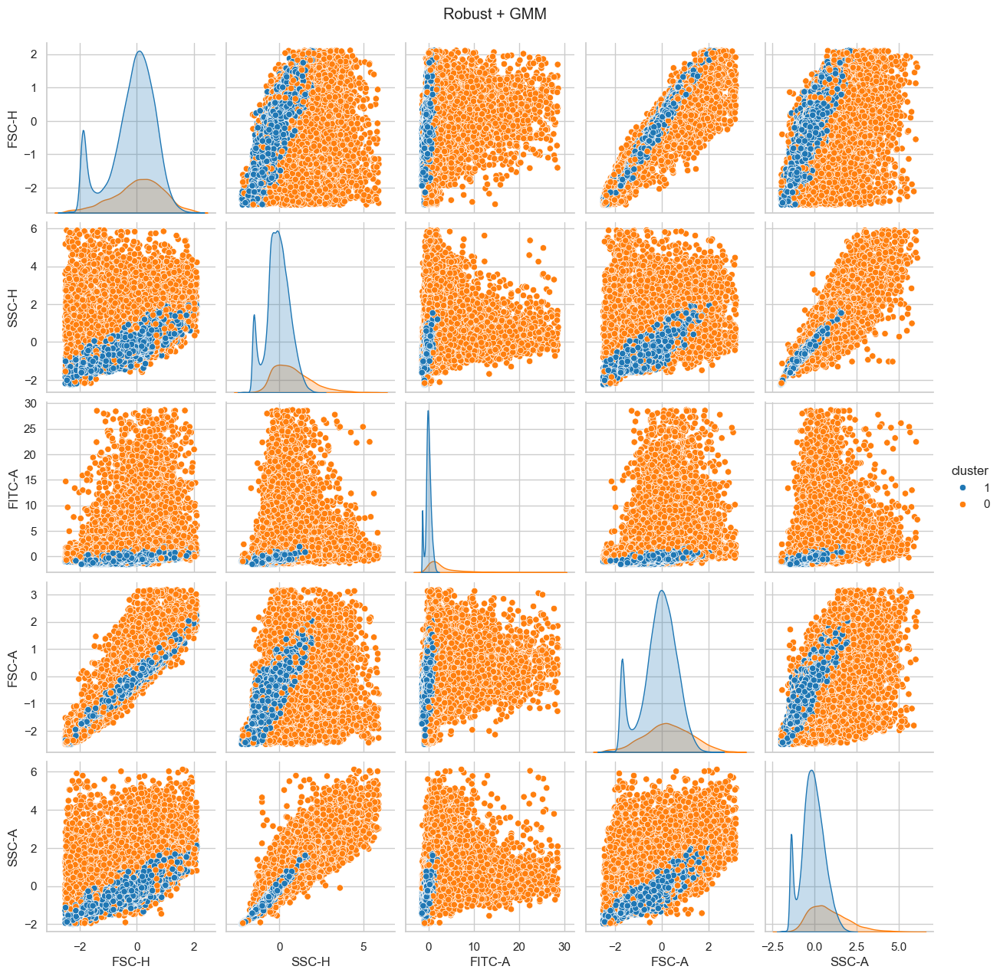

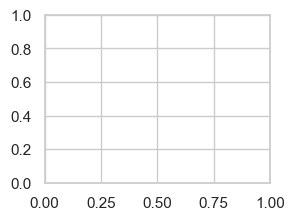

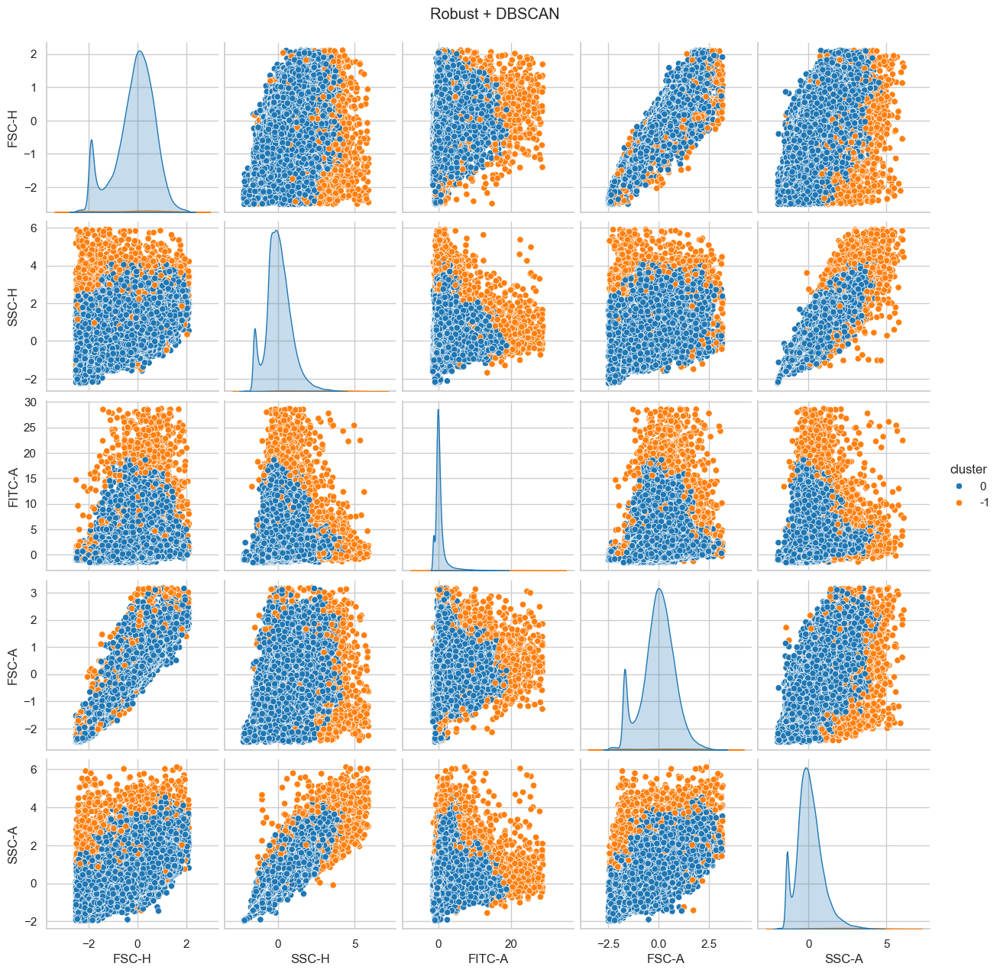

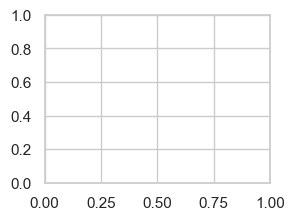

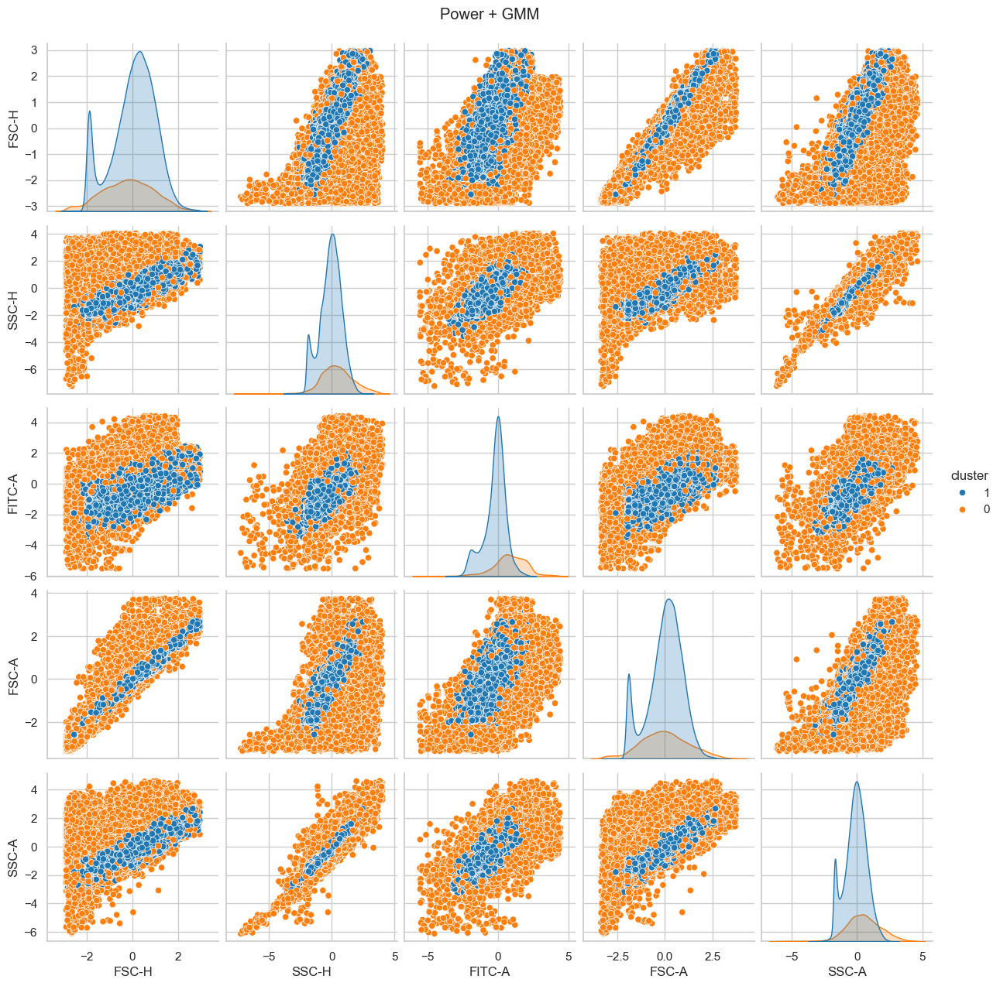

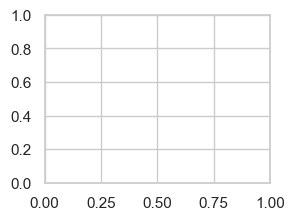

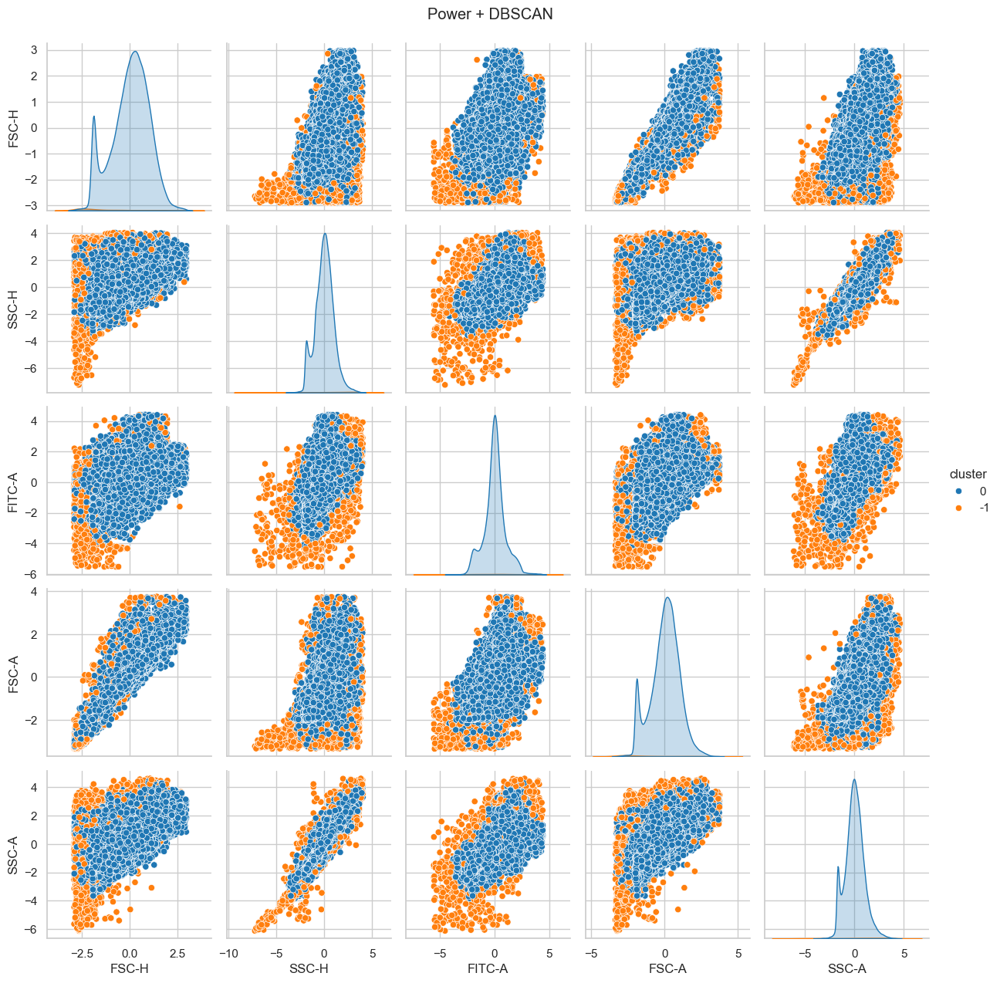

In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import RobustScaler, PowerTransformer, StandardScaler
from sklearn.mixture import GaussianMixture
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.utils import shuffle

# ==== Функции для преобразований ====

def robust_scale(df, channels):
    df_scaled = df.copy()
    scaler = RobustScaler()
    df_scaled[channels] = scaler.fit_transform(df_scaled[channels])
    return df_scaled

def power_transform(df, channels):
    df_scaled = df.copy()
    pt = PowerTransformer(method='yeo-johnson', standardize=True)
    df_scaled[channels] = pt.fit_transform(df_scaled[channels])
    return df_scaled

# ==== Кластеризация ====

def cluster_and_evaluate(X, y_true, method_name, params):
    scaler = params.get("scaler", StandardScaler())
    X_scaled = scaler.fit_transform(X)

    # GMM
    gmm = GaussianMixture(n_components=params.get("n_components", 2), random_state=42)
    gmm_labels = gmm.fit_predict(X_scaled)

    # DBSCAN
    db = DBSCAN(eps=params.get("eps", 0.5), min_samples=params.get("min_samples", 5))
    db_labels = db.fit_predict(X_scaled)

    # Метрики
    gmm_ari = adjusted_rand_score(y_true, gmm_labels)
    db_ari = adjusted_rand_score(y_true, db_labels)
    gmm_ami = adjusted_mutual_info_score(y_true, gmm_labels)
    db_ami = adjusted_mutual_info_score(y_true, db_labels)

    print(f"=== {method_name} ===")
    print("GMM cluster counts:", pd.Series(gmm_labels).value_counts())
    print("DBSCAN cluster counts: ", pd.Series(db_labels).value_counts())
    print("GMM ARI:", gmm_ari)
    print("DBSCAN ARI:", db_ari)
    print("GMM AMI:", gmm_ami)
    print("DBSCAN AMI:", db_ami)

    return gmm_labels, db_labels

# ==== Подготовка данных ====

channels = ['FSC-H', 'SSC-H', 'FITC-A', 'FSC-A', 'SSC-A']

# Преобразуем

df1_robust = robust_scale(df1, channels)
df2_robust = robust_scale(df2, channels)
df1_power = power_transform(df1, channels)
df2_power = power_transform(df2, channels)

# Объединяем

def combine_and_shuffle(d1, d2):
    combined = pd.concat([d1, d2], axis=0).reset_index(drop=True)
    combined = shuffle(combined, random_state=42)
    return combined

robust_combined = combine_and_shuffle(df1_robust, df2_robust)
power_combined = combine_and_shuffle(df1_power, df2_power)

X_robust = robust_combined[channels]
X_power = power_combined[channels]

# Метки для оценки кластеризации

y_true = np.array([0]*len(df1) + [1]*len(df2))
y_true = shuffle(y_true, random_state=42)

# Параметры кластеризации

params = {
"scaler": StandardScaler(),
"n_components": 2,
"eps": 1,
"min_samples": 100,
}

# ==== Кластеризация ====

gmm_labels_robust, db_labels_robust = cluster_and_evaluate(X_robust, y_true, "robust", params)
gmm_labels_power, db_labels_power = cluster_and_evaluate(X_power, y_true, "power", params)

# ==== Визуализация матрицы скаттеров ====

def plot_scatter_matrix(X, labels, title):
    df_plot = X.copy()
    df_plot["cluster"] = labels.astype(str)
    sns.set(style="whitegrid")
    sns.pairplot(df_plot, hue="cluster", palette="tab10", diag_kind="kde", corner=False)
    plt.suptitle(title, y=1.02)
    plt.show()

# Собираем сабплоты

plt.figure(figsize=(20, 20))

plt.subplot(2,2,1)
plot_scatter_matrix(X_robust, gmm_labels_robust, "Robust + GMM")

plt.subplot(2,2,2)
plot_scatter_matrix(X_robust, db_labels_robust, "Robust + DBSCAN")

plt.subplot(2,2,3)
plot_scatter_matrix(X_power, gmm_labels_power, "Power + GMM")

plt.subplot(2,2,4)
plot_scatter_matrix(X_power, db_labels_power, "Power + DBSCAN")
plt.show()
